# Computer Vision

# Detecting Faces in Images

**Face Detection** is a process of analyzing the visiual imput to determine whether faces are present in an image or video. These models are trained on large samples of data varying in race, age, gender, lighting, angles, orentation to be accurate.


## Method 1: Haar Cascade Classifers

Within OpenCV (Open Source Computer Vision), Viola and Jones (2001) have created a pre-trained object detection classifier using Haar feature-based cascade classifiers. This method is particularly effective for face detection and is widely used due to its robustness and real-time performance capabilities.Haar features are scaled shapes comprised of edge features (1, 2) and line features (3).

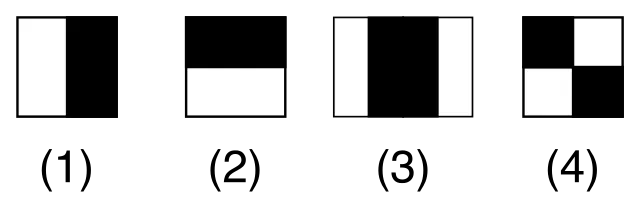  
(via https://medium.com/analytics-vidhya/what-is-haar-features-used-in-face-detection-a7e531c8332b)

These features are represented by numerical values from the pixels, where 0 represents white and 1 represents black. The closer the value is to 1, the greater the chance of detecting a Haar feature in the image.

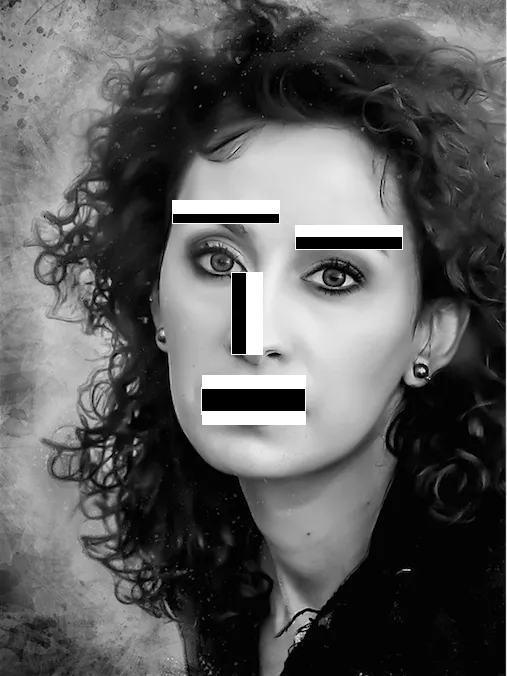
(via https://medium.com/analytics-vidhya/what-is-haar-features-used-in-face-detection-a7e531c8332b)

**Haar Cascade Classifiers:** Each stage consists of a strong classifier trained using AdaBoost. The cascade structure is designed such that simpler classifiers that require fewer calculations are used first, and more complex classifiers are used in later stages. This hierarchical approach significantly reduces the computation time because it quickly eliminates non-face regions, focusing computational resources on more promising areas.

For a visual explanation, you can watch this: https://www.youtube.com/watch?v=hPCTwxF0qf4


For more information about Haar Cascade Classifers see https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html or read Viola and Jones's (2001) work titled "Rapid Object Detection using a Boosted Cascade of Simple Features."

**Step 1:** Import OpenCV

In [ ]:
!pip install opencv-python

**Step 2:** Select an image (or set of images) that you want to analyze and load the classifier.

In [ ]:
import cv2

imagePath = '/content/drive/MyDrive/sra_images/K-pop.jpeg'

img = cv2.imread(imagePath) #put the file path to the image in a Numpy array.

img.shape #print the shape of the image. This image will be in 3 dimentions (Red, Blue, Green).

gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Convert the image to grayscale to improve efficiency.

gray_image.shape # Print the shape of the grayscale image.

face_classifier = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
) #Load the classifier. The classifier is already within OpenCV

**Step 3:** Perform the face detection on the grayscale image.

In [ ]:
face = face_classifier.detectMultiScale(
    gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40)
)
# Multiscale is useful when you have faces at different sizes within the image.
#scaleFactor wil scale down larger images to make it easier to detect faces. We are reducing the image size by 10%
#minNeighbors is the cascade classifer creating a sliding window to detect faces. minNeighbors specifies the number of neighboring rectangles that need to be identified for an object to be considered a valid detection.
#minSize of the face to be detected. It will ignore faces smaller than this.

for (x, y, w, h) in face:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 4) #Drawing a box around the faces in the image.

**Step 4:** Display the processed image.

(-0.5, 999.5, 561.5, -0.5)

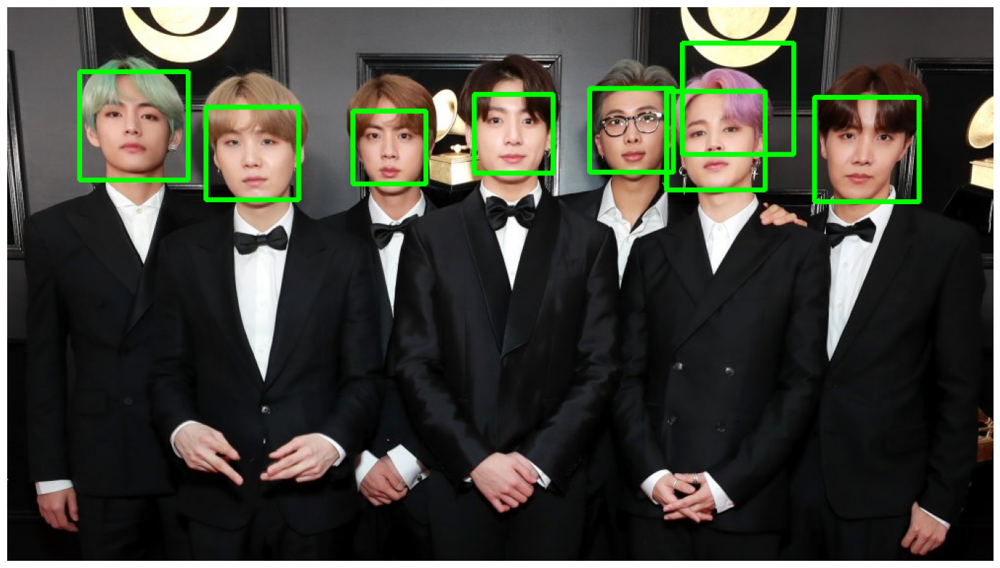

In [ ]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #Covert the image back into color.

import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plt.imshow(img_rgb)
plt.axis('off')

## Method 2: DeepFace

DeepFace is a facial recognition framework containing several state-of-the-art pre-trained models for face detection. This package is particularly useful as it performs several image preprocessing steps in the background (detecting, aligning, normalizing, and verifying faces).

- **VGG-Face:** Developed by the Visual Geometry Group at the University of Oxford, this model uses a deep convolutional neural network.
- **FaceNet:** Developed by Google, this model is particularly good at face differentiation.
- **OpenFace:** Open source and particularly good at real-time analysis of faces.
- **DeepFace:** Developed by Facebook, known for its robustness and accuracy.
- **DeepID:** Developed by the University of Hong Kong, this model utilizes deep convolutional layers to extract faces.
- **ArcFace:** Developed by Microsoft, this model is widely used both academically and commercially.
- **And More...**

For more information about DeepFace and the training process underlying the model, see (https://www.cs.toronto.edu/~ranzato/publications/taigman_cvpr14.pdf)

### Calculating the Number of Faces in an Image

**Step 1** Install and load the relevant packages.

In [ ]:
!pip install deepface matplotlib ultralytics
from deepface import DeepFace
import cv2
import matplotlib.pyplot as plt

**Step 2:** Define the count_faces function

*Note:* Within DeepFace, we are using YOLOv8 (You Only Look Once) which is a highly accurate detector for faces. "YOLOv8 is built on cutting-edge advancements in deep learning and computer vision, offering unparalleled performance in terms of speed and accuracy" (https://docs.ultralytics.com/)

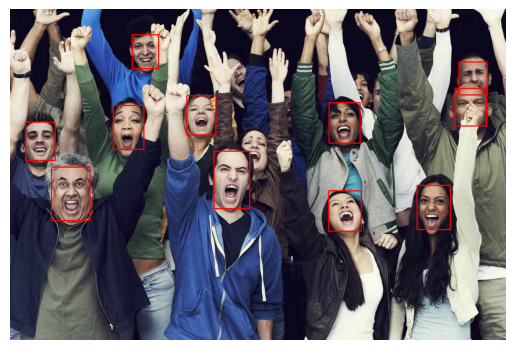

Number of faces detected: 11


11

In [ ]:
def count_faces(image_path):
    # Load the image
    img = cv2.imread(image_path)

    # Convert image from BGR to RGB (OpenCV loads images in BGR)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Detect faces
    detected_faces = DeepFace.extract_faces(img_rgb, detector_backend='yolov8', enforce_detection=True) #Setting this to True will force the model to find a face within an image.

    # Draw rectangles around each detected face
    for face in detected_faces:
        x, y, w, h = face['facial_area']['x'], face['facial_area']['y'], face['facial_area']['w'], face['facial_area']['h']
        cv2.rectangle(img_rgb, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Display the image with detected faces
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

    # Print and return the number of faces detected
    face_count = len(detected_faces)
    print(f"Number of faces detected: {face_count}")
    return face_count

image_path = "/content/drive/MyDrive/sra_images/crowd.jpg"
count_faces(image_path)



### Multiple Faces in Multiple Images

Using the same logic, we will now have DeepFace and YOLOv8 go through a folder of images and save the number of faces and the size of faces to a CSV file.

- **x and y:** The x- and y-coordinates of the top-left corner of the bounding box.
- **w:** The width of the bounding box.
- **h:** The height of the bounding box.


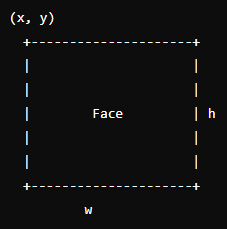

These metrics can be beneficial in determining the number of faces in an image as well as the size of each face in an image.

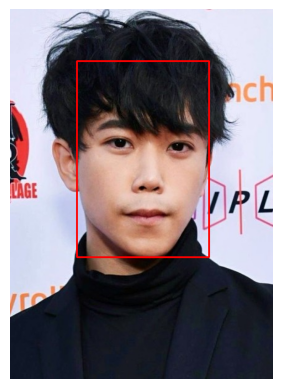

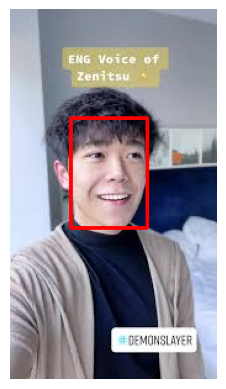

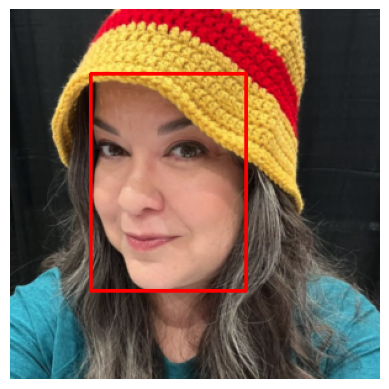

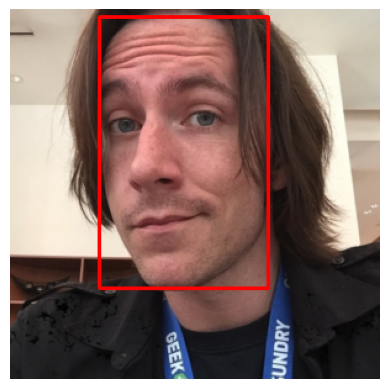

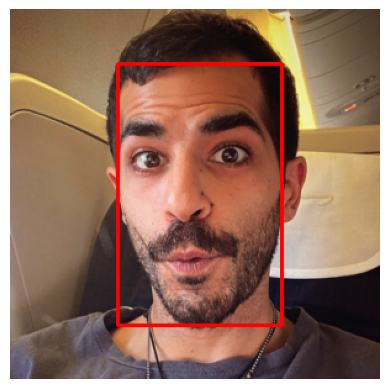

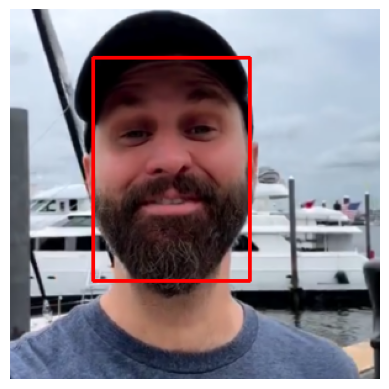

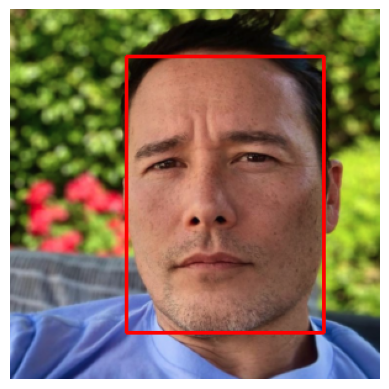

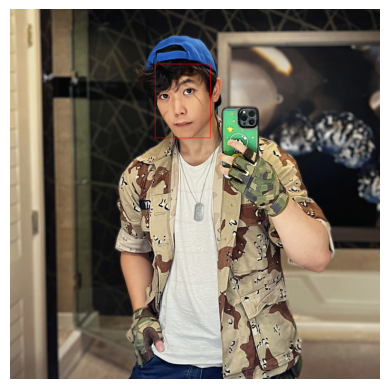

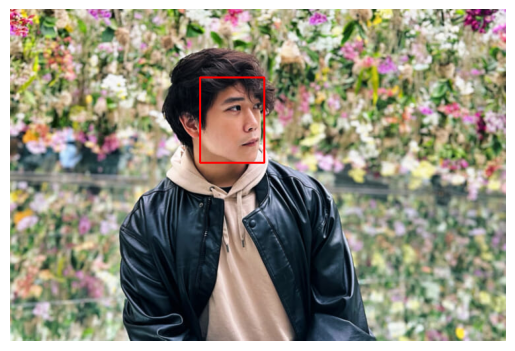

Error: Could not load image at /content/drive/MyDrive/sra_images/ds_model_vggface_detector_opencv_aligned_normalization_base_expand_0.pkl. Check if the file exists and is not corrupted.


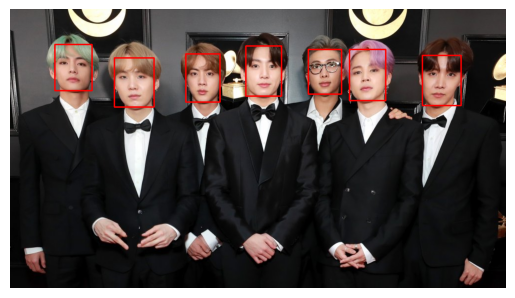

Error: Could not load image at /content/drive/MyDrive/sra_images/faces.csv. Check if the file exists and is not corrupted.


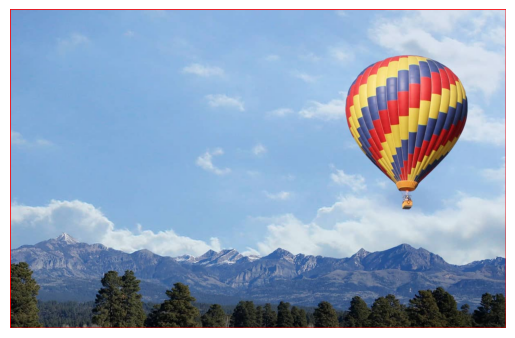

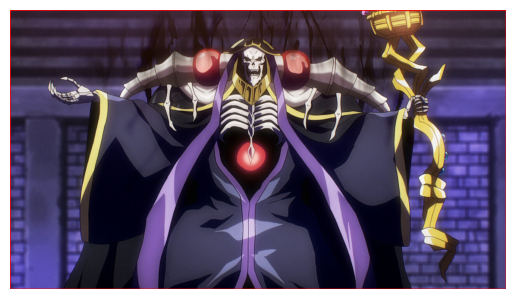

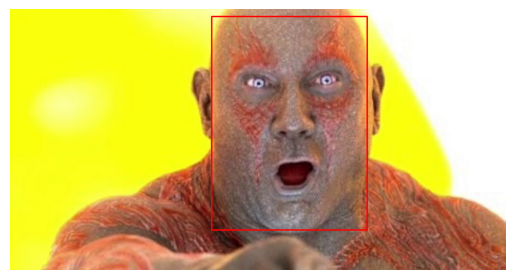

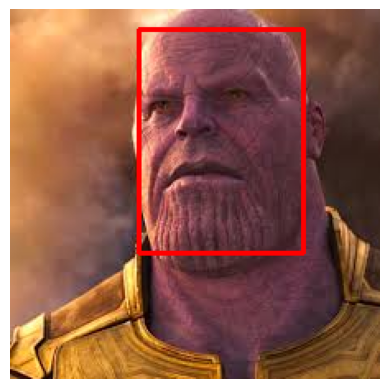

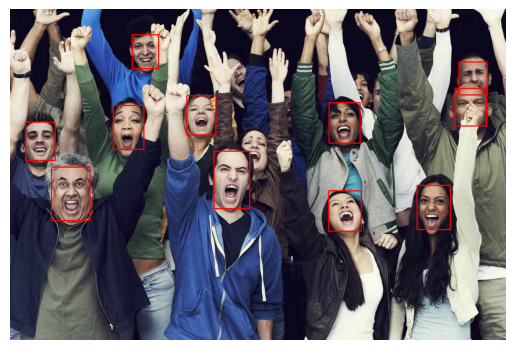

Error: Could not load image at /content/drive/MyDrive/sra_images/face_data.csv. Check if the file exists and is not corrupted.
Error: Could not load image at /content/drive/MyDrive/sra_images/ds_model_vggface_detector_yolov8_aligned_normalization_base_expand_0.pkl. Check if the file exists and is not corrupted.


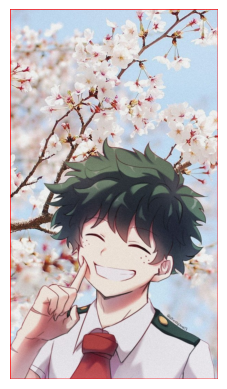

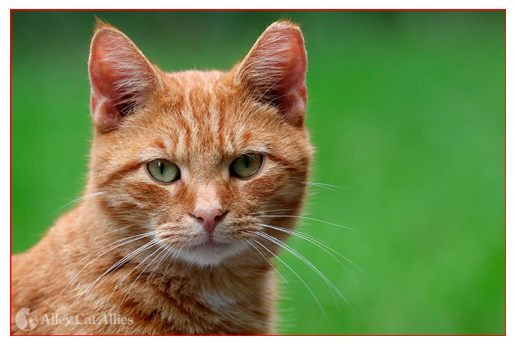

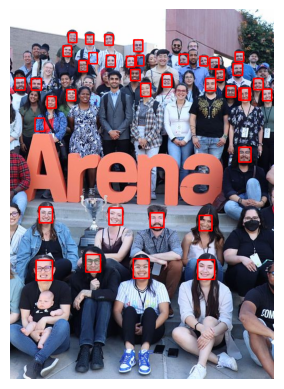

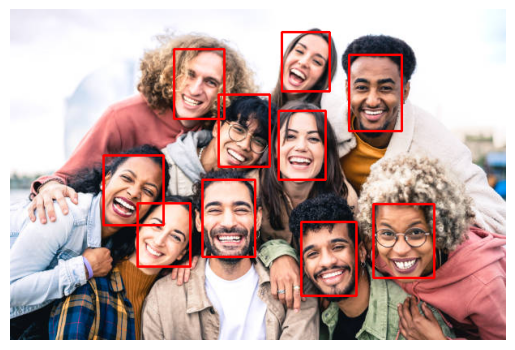

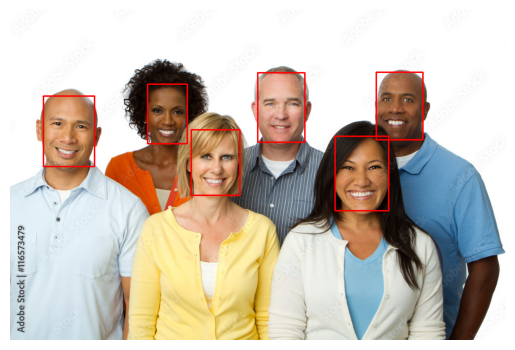

Error: Could not load image at /content/drive/MyDrive/sra_images/face_analysis_results.csv. Check if the file exists and is not corrupted.
                                           image_path    x    y    w    h  \
0      /content/drive/MyDrive/sra_images/AleksLe2.jpg  108   84  214  318   
1      /content/drive/MyDrive/sra_images/AleksLe3.jpg   49   88   62   89   
2        /content/drive/MyDrive/sra_images/Actor1.png   65   52  126  176   
3        /content/drive/MyDrive/sra_images/Actor2.png   72    6  137  220   
4        /content/drive/MyDrive/sra_images/Actor3.png   87   44  133  212   
..                                                ...  ...  ...  ...  ...   
83  /content/drive/MyDrive/sra_images/1000_F_11657...  365  243   98  132   
84  /content/drive/MyDrive/sra_images/1000_F_11657...   67  175  103  142   
85  /content/drive/MyDrive/sra_images/1000_F_11657...  499  128   95  140   
86  /content/drive/MyDrive/sra_images/1000_F_11657...  738  127   94  136   
87  /content/d

In [ ]:
import cv2
import matplotlib.pyplot as plt
from deepface import DeepFace
import pandas as pd
import os

#Same functions as before for counting the number of faces
def count_faces(image_path):
    # Load the image
    img = cv2.imread(image_path)

  # Check if the image was loaded successfully
    if img is None:
        print(f"Error: Could not load image at {image_path}. Check if the file exists and is not corrupted.")
        return [], 0  # Return empty data and count if image loading fails

    # Convert image from BGR to RGB (OpenCV loads images in BGR)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Detect faces, disabling strict detection
    detected_faces = DeepFace.extract_faces(img_rgb, detector_backend='yolov8', enforce_detection=False) # We will not force the model to find a face since some of the images do not have faces.

    face_data = []

    # Draw rectangles around each detected face and collect face data
    for face in detected_faces:
        x, y, w, h = face['facial_area']['x'], face['facial_area']['y'], face['facial_area']['w'], face['facial_area']['h']
        cv2.rectangle(img_rgb, (x, y), (x + w, y + h), (255, 0, 0), 2)
        face_data.append({
            'image_path': image_path,
            'x': x,
            'y': y,
            'w': w,
            'h': h
        })

    # Display the image with detected faces
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

    # Return face data and the count of detected faces
    return face_data, len(detected_faces)

def process_images_in_folder(folder_path):
    all_face_data = []

    # List all files in the folder
    for filename in os.listdir(folder_path):
        # Construct full file path
        image_path = os.path.join(folder_path, filename)

        # Check if it is a file
        if os.path.isfile(image_path):
            face_data, face_count = count_faces(image_path)
            for face in face_data:
                face['face_count'] = face_count
            all_face_data.extend(face_data)

    # Create DataFrame from face data
    df = pd.DataFrame(all_face_data)
    return df

# Set Path to the Folder that Contains Your Images
folder_path = "/content/drive/MyDrive/sra_images"
face_df = process_images_in_folder(folder_path)
print(face_df)

# Save DataFrame to a CSV file
face_df.to_csv("/content/drive/MyDrive/sra_images/face_data.csv", index=False)


### Facial Similarity and Recognition


Using the DeepFace models, facial images can be compared to identify the similarity between faces or recognize the same face across multiple images.

This process can be beneficial for determining if individuals in different images look similar (highlighting potential biases in appearance) or for identifying how frequently specific individuals appear within a set of images (highlighting potential bias toward a certain individual).

In [ ]:
result = DeepFace.verify(img1_path = "/content/drive/MyDrive/sra_images/AleksLe3.jpg", img2_path = "/content/drive/MyDrive/sra_images/AleksLe2.jpg")
print(result)

24-07-11 08:07:26 - vgg_face_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/vgg_face_weights.h5
To: /root/.deepface/weights/vgg_face_weights.h5
100%|██████████| 580M/580M [00:04<00:00, 131MB/s]


{'verified': True, 'distance': 0.49582727312842856, 'threshold': 0.68, 'model': 'VGG-Face', 'detector_backend': 'opencv', 'similarity_metric': 'cosine', 'facial_areas': {'img1': {'x': 46, 'y': 92, 'w': 75, 'h': 75, 'left_eye': None, 'right_eye': None}, 'img2': {'x': 84, 'y': 121, 'w': 276, 'h': 276, 'left_eye': (273, 224), 'right_eye': (176, 218)}}, 'time': 13.47}


In [ ]:
df = DeepFace.find(img_path = "/content/drive/MyDrive/sra_images/AleksLe2.jpg", db_path = "/content/drive/MyDrive/sra_images", enforce_detection=False)
print(df)

24-07-11 08:11:43 - Found 2215 newly added image(s), 0 removed image(s), 9 replaced image(s).


Finding representations:  98%|█████████▊| 2169/2224 [38:43<00:44,  1.22it/s]

## Method 3: Convolutional Neural Network

A Convolutional Neural Network (CNN) is a type of deep learning model that excels at processing and analyzing visual data. Some models in DeepFace use CNNs.

The process starts with inputting the raw information from the image into the model. The first layer, called the convolutional layer, slides over the image, capturing local patterns such as edges, textures, and shapes. Next, an activation layer determines which features are important for the model to focus on. The most common activation function, ReLU, keeps positive values and drops negative ones.

Following this, the pooling layer reduces the size of the feature maps created by the filters, making the data more manageable. After several rounds of capturing patterns and reducing image size, the model connects all the findings in a fully connected layer. In this layer, each pattern can influence every other pattern, helping the model make the final decision. Finally, the output layer provides the model's result.

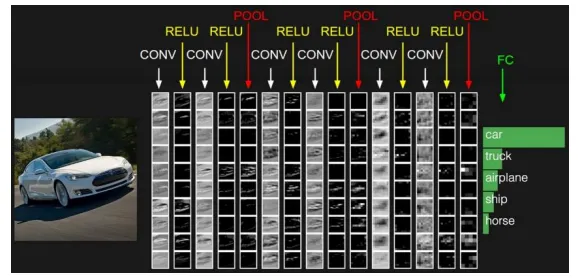

(via https://python.plainenglish.io/convolution-neural-network-cnn-in-deep-learning-77f5ab457166)

For more information about CNN see https://www.geeksforgeeks.org/introduction-convolution-neural-network/


**Step 1:** Import the required libraries for configuing a machine learning model.

*Note:* CNN code is adapted from https://www.kaggle.com/code/vortexkol/firearms-detection. Also, using a GPU for this is highly beneficial to speed the analysis process.

In [ ]:
import torch
import pandas as pd
import shutil
import os
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import cv2
import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import time
import random

#Batch is determinig the amount of images we will process at a time during the training process.
BATCH_SIZE = 4 # increase / decrease according to GPU memeory
#Resizing is a common preprocessing step to ensure equal size of all the images.
RESIZE_TO = 512 # resize the image for training
#Specifying we want to use a GPU to make faster computation.
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

#We are interested in classifying objects as either being a face or the background.
CLASSES = ['background', 'Face']
NUM_CLASSES = 2

**Step 2:** Develop the training and testing split. For this model we are training a model rather than using an already pretrained one.

In [ ]:
def train_valid_test_split(faces_csv=None, split=0.15):
    all_df = pd.read_csv(faces_csv)

    # sample out 500 images
    all_df = all_df.sample(n=500, random_state=7)

    # Shuffle the CSV file rows.
    all_df.sample(frac=1) #This will allow us a random distribution.
    len_df = len(all_df)

    # Split into train/validation and test sets
    trainTest_split = int((1-split)*len_df)

    trainVal_df = all_df[:trainTest_split]
    test_df = all_df[trainTest_split:]

    # Further split train/validation set into train and validation sets
    lenTV_df = len(trainVal_df)

    trainVal_split = int((1-split)*lenTV_df)

    train_df = trainVal_df[:trainVal_split]
    valid_df = trainVal_df[trainVal_split:]

    return train_df, valid_df, test_df

train_df, valid_df, test_df = train_valid_test_split(faces_csv='/content/drive/MyDrive/sra_images/faces.csv')

**Step 3:** Track and compute Loss over Itterations and group the data.

In [ ]:
class Averager:
# The Averager class helps in tracking and computing the average of values (loss) over multiple iterations, which is useful for monitoring model performance during training and validation
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0


def collate_fn(batch):
#The collate_fn function is used in data loading to handle batches of images with varying numbers of objects and sizes.
    return tuple(zip(*batch))

**Step 4:** Initialization, Item Retrieval, and Length

- **Initialization:** Loads image paths, filters them based on the dataset, and sets up dimensions.
- **Item Retrieval:** Reads and processes images, resizes them, and extracts bounding box information, converting everything into the appropriate format for training.
- **Length:** Returns the number of images in the dataset.

In [ ]:
import glob as glob
from torch.utils.data import Dataset, DataLoader

# Creating the dataset class

class Faces(Dataset):
#The __init__ method sets up the dataset by loading image paths and filtering images based on the provided dataset.
    def __init__(self, dataset, width, height, dir_path="/content/drive/MyDrive/sra_images/images/images"):
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.dataset = dataset

        # copy image names to list
        self.set_image_names = self.dataset['image_name'].tolist()

        # get all the image names in sorted order
        self.image_paths = glob.glob(f"{self.dir_path}/*.jpg")
        self.all_images = [image_path.split('/')[-1] for image_path in self.image_paths]
        self.all_images = sorted(self.all_images)

        # cut down to only images present in dataset
        self.images = []

        for i in self.set_image_names:
            for j in self.all_images:
                if i == j:
                    self.images.append(i)
#The __getitem__ method retrieves an image and its corresponding bounding box annotations by index.
    def __getitem__(self, idx):

        # capture the image name and the full image path
        image_name = self.images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # read the image
        image = cv2.imread(image_path)

        # convert BGR to RGB color format and resize
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # channel first transposing
        image_resized = np.transpose(image_resized, (2, 0, 1))

        boxes = []
        labels = []

        # Copy bounding box coordinates and image dimensions
        filtered_df = self.dataset.loc[self.dataset['image_name'] == image_name]

        for i in range(len(filtered_df)):

            # xmax = left corner x-coordinates
            xmin = int(filtered_df['x0'].iloc[i])
            # xmax = right corner x-coordinates
            xmax = int(filtered_df['x1'].iloc[i])
            # ymin = left corner y-coordinates
            ymin = int(filtered_df['y0'].iloc[i])
            # ymax = right corner y-coordinates
            ymax = int(filtered_df['y1'].iloc[i])

            image_width = int(filtered_df['width'].iloc[i])
            image_height = int(filtered_df['height'].iloc[i])

            # resize the bounding boxes according to the...
            # ... desired `width`, `height`
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            yamx_final = (ymax/image_height)*self.height

            boxes.append([xmin_final, ymin_final, xmax_final, yamx_final])
            labels.append(1) # 1 because there is only one class

        # bounding box to tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # area of the bounding boxes
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # crowd instances
        if boxes.shape[0] > 1:
            iscrowd = torch.ones((boxes.shape[0],), dtype=torch.int64)
        else:
            iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)

        # label to tensor
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # prepare the final `target` dictionary
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        return image_resized, target

#The __len__ method returns the total number of images in the dataset.
    def __len__(self):
        return len(self.set_image_names)

**Step 5:** Create instances for the training and testing data and specify the Data Loader based on our batch size.

In [ ]:
train_dataset = Faces(train_df, RESIZE_TO, RESIZE_TO)
valid_dataset = Faces(valid_df, RESIZE_TO, RESIZE_TO)

# defining train and validation sets data loaders

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True, #Randomizes the order of the data. Prevents the model from learning any patterns due to order effects.
    num_workers=0, # Data loading will be done during the main process. Can be increased to use multiple cores for processing.
    collate_fn=collate_fn # Handles the batching of images and their associated data.
)
valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}\n")

Number of training samples: 361
Number of validation samples: 64



**Step 6:** (Optional) Visualize a sample of the analyzed training data.

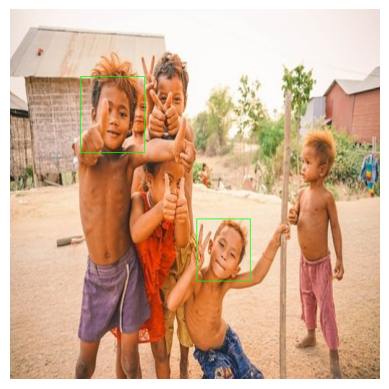

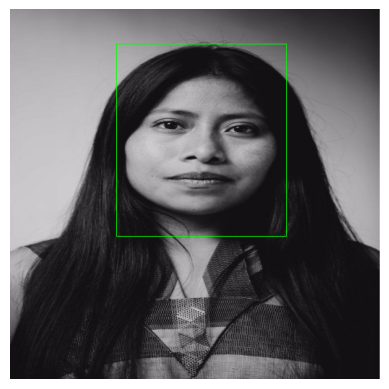

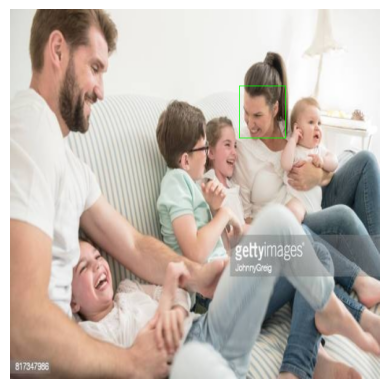

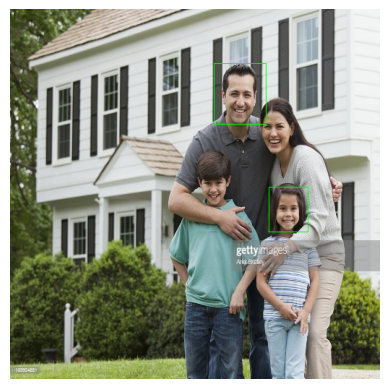

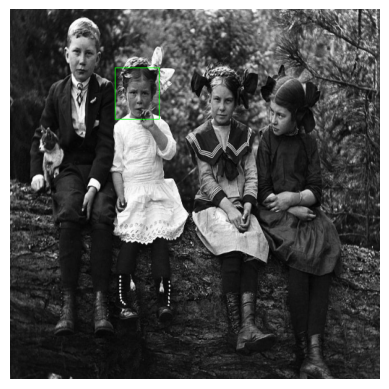

In [ ]:
# function to visualize sample

def visualize_sample(image, target):
    for box in target['boxes']:
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])), (int(box[2]), int(box[3])),
            (0, 255, 0), 1
        )

    plt.imshow(image)
    plt.axis('off')
    plt.show()

NUM_SAMPLES_TO_VISUALIZE = 5
for i in range(NUM_SAMPLES_TO_VISUALIZE):
    image, target = train_dataset[i]
    image = np.transpose(image, (1, 2, 0))
    visualize_sample(image, target)

**Step 7:** Creating a Faster R-CNN using the ResNet-50 in the backend.

The create_model function customizes a pre-trained Faster R-CNN model for a specific object detection task by modifying its prediction head to accommodate the desired number of classes. This allows the model to be fine-tuned or used directly for tasks involving a different number of object categories than it was originally trained on.

In [ ]:
# defining model
def create_model(num_classes):

    # load Faster RCNN pre-trained model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='DEFAULT')

    # get the number of input features
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # define a new head for the detector with required number of classes
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

**Step 8:** Specifying how to handle the training iterations for all batches of data.

This function orchestrates the training process for a machine learning model by iterating over batches of data, performing forward passes, computing losses, performing backpropagation, and updating model parameters. The progress is tracked using a tqdm progress bar, and the loss values are recorded and returned at the end of the function.

In [ ]:
# function for running training iterations

def train(train_data_loader, model):
    print('Training')
    global train_itr
    global train_loss_list

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(torch.from_numpy(image).to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        train_loss_list.append(loss_value)
        train_loss_hist.send(loss_value)
        losses.backward()
        optimizer.step()
        train_itr += 1

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return train_loss_list

**Step 9:** Specifying how to handle the testing iterations.

It is practically the same as step 8, but for the testing (validation) data.

In [ ]:
# function for running validation iterations

def validate(valid_data_loader, model):
    print('Validating')
    global val_itr
    global val_loss_list

    # initialize tqdm progress bar
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(torch.from_numpy(image).to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        val_loss_list.append(loss_value)
        val_loss_hist.send(loss_value)
        val_itr += 1
        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return val_loss_list

**Step 10:** Set up the model, optimizer, loss trackers, and configuration for training and testing for a specified number of epochs.

 At the end of the training, we plot the training and validation losses.

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 131MB/s]



EPOCH 1 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #1 train loss: 0.286
Epoch #1 validation loss: 0.187
Took 2.394 minutes for epoch 1

EPOCH 2 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #2 train loss: 0.166
Epoch #2 validation loss: 0.133
Took 1.262 minutes for epoch 2

EPOCH 3 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #3 train loss: 0.135
Epoch #3 validation loss: 0.118
Took 1.249 minutes for epoch 3

EPOCH 4 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #4 train loss: 0.124
Epoch #4 validation loss: 0.117
Took 1.240 minutes for epoch 4

EPOCH 5 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #5 train loss: 0.115
Epoch #5 validation loss: 0.114
Took 1.242 minutes for epoch 5

EPOCH 6 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #6 train loss: 0.106
Epoch #6 validation loss: 0.112
Took 1.238 minutes for epoch 6

EPOCH 7 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #7 train loss: 0.100
Epoch #7 validation loss: 0.116
Took 1.243 minutes for epoch 7

EPOCH 8 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #8 train loss: 0.096
Epoch #8 validation loss: 0.110
Took 1.236 minutes for epoch 8

EPOCH 9 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #9 train loss: 0.090
Epoch #9 validation loss: 0.114
Took 1.244 minutes for epoch 9

EPOCH 10 of 10
Training


  0%|          | 0/91 [00:00<?, ?it/s]

Validating


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch #10 train loss: 0.084
Epoch #10 validation loss: 0.107
Took 1.242 minutes for epoch 10


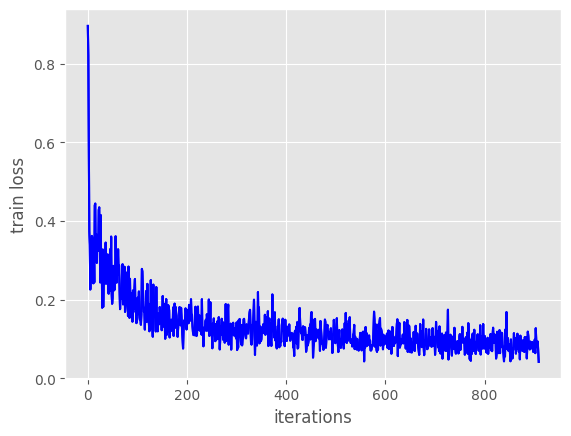

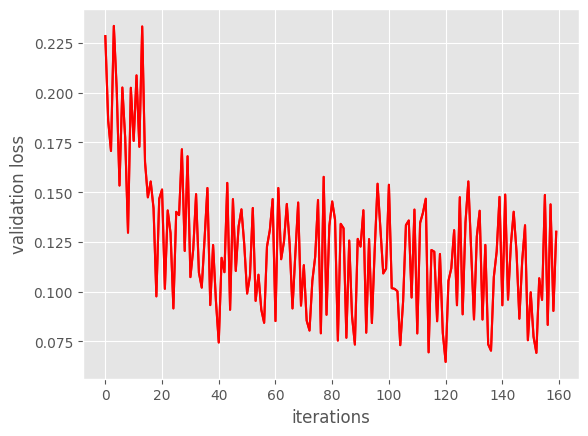

In [ ]:
# Set the plotting style to 'ggplot' for better aesthetics
plt.style.use('ggplot')

NUM_EPOCHS = 10 # Number of epochs to train for

# Initialize the model with the specified number of classes and move it to the computation device (GPU or CPU)
model = create_model(num_classes=NUM_CLASSES)
model = model.to(DEVICE)

# Get the model parameters that require gradients for optimization
params = [p for p in model.parameters() if p.requires_grad]

# Define the optimizer with SGD, learning rate, momentum, and weight decay
optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

# Initialize the Averager class instances to track training and validation loss
train_loss_hist = Averager()
val_loss_hist = Averager()

# Initialize iteration counters for training and validation
train_itr = 1
val_itr = 1

# Lists to store training and validation loss values for plotting
train_loss_list = []
val_loss_list = []

# Name to save the trained model with
MODEL_NAME = 'model'

# Start the training epochs
for epoch in range(NUM_EPOCHS):
    print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

    # Reset the training and validation loss histories for the current epoch
    train_loss_hist.reset()
    val_loss_hist.reset()

    # Start the timer and carry out training and validation
    start = time.time()
    train_loss = train(train_loader, model) # Train the model and get the training loss
    val_loss = validate(valid_loader, model) # Validate the model and get the validation loss

    # Print the average training and validation loss for the current epoch
    print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
    print(f"Epoch #{epoch+1} validation loss: {val_loss_hist.value:.3f}")

    end = time.time()
    print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch+1}")

    if (epoch+1) == NUM_EPOCHS: # Save loss plots and model once at the end
        # Create two subplots, one for each: training and validation loss
        figure_1, train_ax = plt.subplots()
        figure_2, valid_ax = plt.subplots()

        # Plot the training loss
        train_ax.plot(train_loss, color='blue')
        train_ax.set_xlabel('iterations')
        train_ax.set_ylabel('train loss')

        # Plot the validation loss
        valid_ax.plot(val_loss, color='red')
        valid_ax.set_xlabel('iterations')
        valid_ax.set_ylabel('validation loss')

# Plot the training loss outside the loop for final display
train_ax.plot(train_loss, color='blue')
train_ax.set_xlabel('iterations')
train_ax.set_ylabel('train loss')

# Plot the validation loss outside the loop for final display
valid_ax.plot(val_loss, color='red')
valid_ax.set_xlabel('iterations')
valid_ax.set_ylabel('validation loss')

# Display the plots
plt.show()

**Step 11:** Evaluate the model's face detection capability on a small sample of images.

Test instances: 75


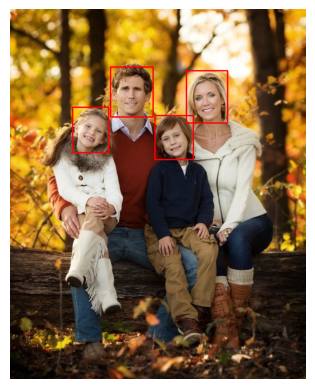

Image 27 done...
--------------------------------------------------


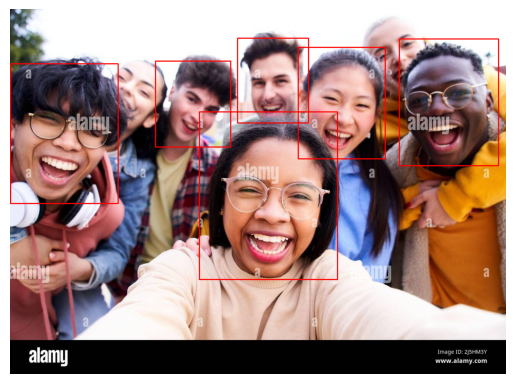

Image 64 done...
--------------------------------------------------


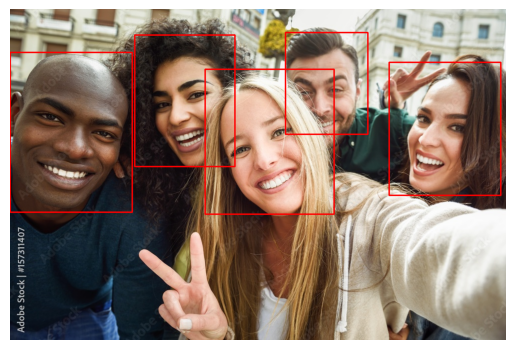

Image 9 done...
--------------------------------------------------


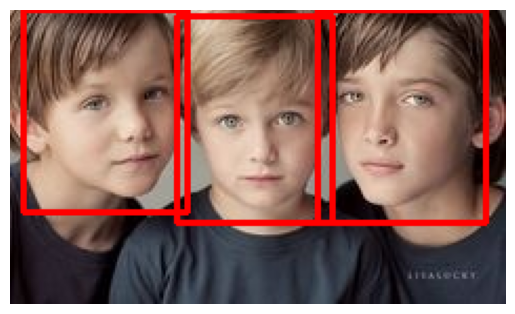

Image 69 done...
--------------------------------------------------


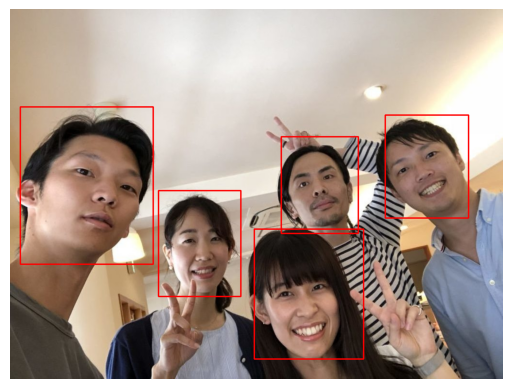

Image 39 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


In [ ]:
# Set the model to evaluation mode
model.eval()

# Define the detection threshold. Any detection with a score below this will be discarded.
detection_threshold = 0.8

# Copy image names from the test dataframe to a list
test_image_names = test_df['image_name'].tolist()

# Get all image names in the specified directory
dir_path = "/content/drive/MyDrive/sra_images/images/images"
image_paths = glob.glob(f"{dir_path}/*.jpg")
all_images = [image_path.split('/')[-1] for image_path in image_paths]
all_images = sorted(all_images)

# Get paths of only images present in the test dataset
test_images = []

for i in test_image_names:
    for j in all_images:
        if i == j:
            test_images.append(os.path.join(dir_path, i))

print(f"Test instances: {len(test_images)}")

# Randomly sample 5 images from the test set for visualization
for i in random.sample(range(len(test_images)), 5):
    # Read the image
    image = cv2.imread(test_images[i])
    orig_image = image.copy()

    # Convert BGR to RGB and normalize the pixel values
    image = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0

    # Transpose the image to bring color channels to the front
    image = np.transpose(image, (2, 0, 1)).astype(float)

    # Convert the image to a tensor and move to the GPU
    image = torch.tensor(image, dtype=torch.float).cuda()

    # Add a batch dimension
    image = torch.unsqueeze(image, 0)

    # Perform inference without computing gradients
    with torch.no_grad():
        outputs = model(image)

    # Move the outputs to CPU for further processing
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]

    # Proceed only if there are detected boxes
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()

        # Filter out boxes according to the detection threshold
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        draw_boxes = boxes.copy()

        # Draw the bounding boxes on the original image
        for j, box in enumerate(draw_boxes):
            cv2.rectangle(orig_image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          (0, 0, 255), 2)

        # Convert the image back to RGB for displaying
        image_rgb = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB)

        # Display the image with bounding boxes
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.show()

    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')

# Detecting Age, Gender, Race, and Emotions in Images

The DeepFace.analyze function is benefical in classifying faces within images based on several different demographic characteristics (e.g., age, gender, race, and emotion).

- **For Gender:** The model will provide you with a probability that the face in the image is male or female and will also indidcate the dominant gender.
- **For Race:** The model will provide you with a probaility tha thte face in the image is Asian, Indian, Black, White, Middle Eastern, or Latino/Hispanic as well as pindicate the dominat race.
- **For Emotion:** The model will provide you with a probaility that the face in the image is angry, disgusted, fearful, happy, sad, suprised, or neutral as well as indicate the dominant emotion.
- **For Age:** The model will provide you with the age it believes the face of the image to be.

24-07-11 20:13:34 - Downloading Yolo weights from https://drive.google.com/uc?id=1qcr9DbgsX3ryrz2uU8w4Xm3cOrRywXqb to /root/.deepface/weights/yolov8n-face.pt...


Downloading...
From: https://drive.google.com/uc?id=1qcr9DbgsX3ryrz2uU8w4Xm3cOrRywXqb
To: /root/.deepface/weights/yolov8n-face.pt
100%|██████████| 6.39M/6.39M [00:00<00:00, 13.0MB/s]


24-07-11 20:13:40 - Yolo model is just downloaded to yolov8n-face.pt


Action: age:   0%|          | 0/4 [00:00<?, ?it/s]    

24-07-11 20:14:07 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /root/.deepface/weights/age_model_weights.h5

  0%|          | 0.00/539M [00:00<?, ?B/s]
  0%|          | 524k/539M [00:00<02:57, 3.03MB/s]
  1%|          | 4.72M/539M [00:00<00:27, 19.8MB/s]
  2%|▏         | 13.1M/539M [00:00<00:11, 44.3MB/s]
  4%|▍         | 22.0M/539M [00:00<00:08, 57.6MB/s]
  6%|▌         | 30.9M/539M [00:00<00:07, 66.4MB/s]
  7%|▋         | 39.3M/539M [00:00<00:06, 71.6MB/s]
  9%|▉         | 47.2M/539M [00:00<00:07, 66.9MB/s]
 10%|█         | 54.5M/539M [00:00<00:07, 64.1MB/s]
 12%|█▏        | 63.4M/539M [00:01<00:06, 71.0MB/s]
 13%|█▎        | 71.8M/539M [00:01<00:06, 74.3MB/s]
 15%|█▍        | 79.7M/539M [00:01<00:06, 71.1MB/s]
 16%|█▌        | 87.0M/539M [00:01<00:06, 70.6MB/s]
 18%|█▊        | 94.4M/539M [00:01<00:06, 69.2MB/s]
 19%|█▉        | 103M/539M [00:01<00:05, 74.1MB/s] 
 21%|██        | 111M/539M [00:01<00:05, 73.7MB/s]
 22%|██▏       | 119

24-07-11 20:14:40 - gender_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/gender_model_weights.h5
To: /root/.deepface/weights/gender_model_weights.h5

  0%|          | 0.00/537M [00:00<?, ?B/s]
  0%|          | 524k/537M [00:00<02:34, 3.48MB/s]
  1%|          | 3.67M/537M [00:00<00:31, 16.9MB/s]
  3%|▎         | 14.7M/537M [00:00<00:09, 54.5MB/s]
  5%|▍         | 26.2M/537M [00:00<00:06, 75.7MB/s]
  7%|▋         | 36.7M/537M [00:00<00:05, 85.0MB/s]
  9%|▉         | 47.7M/537M [00:00<00:05, 92.6MB/s]
 11%|█         | 57.7M/537M [00:00<00:05, 94.6MB/s]
 13%|█▎        | 69.2M/537M [00:00<00:04, 98.9MB/s]
 15%|█▌        | 80.7M/537M [00:00<00:04, 103MB/s] 
 17%|█▋        | 91.2M/537M [00:01<00:04, 102MB/s]
 19%|█▉        | 102M/537M [00:01<00:04, 102MB/s] 
 21%|██        | 112M/537M [00:01<00:04, 102MB/s]
 23%|██▎       | 123M/537M [00:01<00:04, 99.8MB/s]
 25%|██▍       | 133M/537M [00:01<00:04, 99.8MB/s]
 27%|██▋       | 144M/537M [00:01<00:03, 100MB/s] 
 29%|██▉       | 155

24-07-11 20:14:56 - race_model_single_batch.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/race_model_single_batch.h5
To: /root/.deepface/weights/race_model_single_batch.h5

  0%|          | 0.00/537M [00:00<?, ?B/s]
  0%|          | 524k/537M [00:00<02:31, 3.53MB/s]
  1%|          | 3.67M/537M [00:00<00:31, 17.1MB/s]
  3%|▎         | 13.6M/537M [00:00<00:10, 50.4MB/s]
  5%|▍         | 24.6M/537M [00:00<00:07, 70.7MB/s]
  7%|▋         | 36.2M/537M [00:00<00:05, 85.0MB/s]
  9%|▊         | 46.7M/537M [00:00<00:05, 91.1MB/s]
 11%|█         | 56.6M/537M [00:00<00:05, 93.8MB/s]
 12%|█▏        | 67.1M/537M [00:00<00:04, 95.5MB/s]
 14%|█▍        | 77.1M/537M [00:00<00:04, 95.9MB/s]
 16%|█▌        | 87.0M/537M [00:01<00:04, 96.6MB/s]
 18%|█▊        | 97.5M/537M [00:01<00:04, 97.5MB/s]
 20%|██        | 108M/537M [00:01<00:04, 99.4MB/s] 
 22%|██▏       | 119M/537M [00:01<00:04, 102MB/s] 
 24%|██▍       | 129M/537M [00:01<00:04, 102MB/s]
 26%|██▌       | 141M/537M [00:01<00:03, 103MB/s]
 28%|██▊    

24-07-11 20:15:07 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5

  0%|          | 0.00/5.98M [00:00<?, ?B/s]
  9%|▉         | 524k/5.98M [00:00<00:01, 3.53MB/s]
100%|██████████| 5.98M/5.98M [00:00<00:00, 22.1MB/s]
Action: emotion: 100%|██████████| 4/4 [01:17<00:00, 19.31s/it]


29  years old  asian   neutral   {'Woman': 4.633859917521477, 'Man': 95.36614418029785}


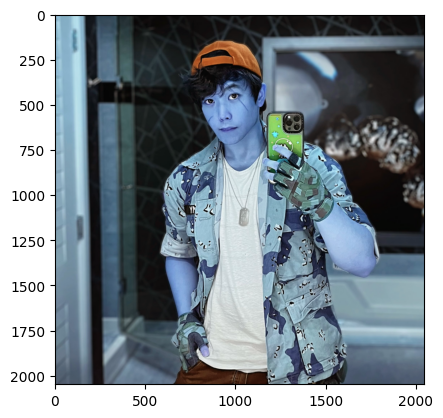

In [ ]:
from deepface import DeepFace
import cv2
import matplotlib.pyplot as plt

#Aleks Le, asian/male/25
img = cv2.imread('/content/drive/MyDrive/sra_images/AleksLe4.jpg')
imgplot = plt.imshow(img) #Printing out the image
obj = DeepFace.analyze(img_path = "/content/drive/MyDrive/sra_images/AleksLe4.jpg", detector_backend = 'yolov8', actions = ['age', 'gender', 'race', 'emotion'])

# Access the first (and only) dictionary in the list
obj_dict = obj[0]

# Now you can access elements using string indices
print(obj_dict["age"]," years old ",obj_dict["dominant_race"]," ",obj_dict["dominant_emotion"]," ", obj_dict["gender"])

### Multiple Faces and Multiple Images

*Note:* You can combine the logic from above to create boxes around the faces to create one data frame with face size, age, gender, race, and emotion.

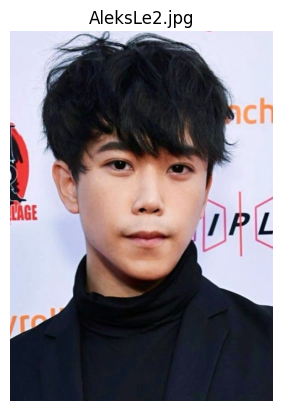

Action: emotion: 100%|██████████| 4/4 [00:05<00:00,  1.38s/it]


Face 1 in AleksLe2.jpg:
Age: 26 years old
Gender: {'Woman': 1.862727478146553, 'Man': 98.13727140426636}
Dominant Race: asian
Dominant Emotion: neutral

--------------------------------------------------

{'age': 26, 'region': {'x': 111, 'y': 108, 'w': 209, 'h': 293, 'left_eye': (273, 224), 'right_eye': (180, 219)}, 'face_confidence': 0.85, 'gender': {'Woman': 1.862727478146553, 'Man': 98.13727140426636}, 'dominant_gender': 'Man', 'race': {'asian': 99.99974370001219, 'indian': 8.76586464594739e-06, 'black': 1.4721900965382107e-08, 'white': 0.00010714600832390788, 'middle eastern': 2.8215886865666662e-08, 'latino hispanic': 0.00014460732425230672}, 'dominant_race': 'asian', 'emotion': {'angry': 0.007483753705936974, 'disgust': 2.460845296446688e-09, 'fear': 0.03298798590203543, 'happy': 0.5293866454050964, 'sad': 0.03621722430847146, 'surprise': 0.0007313289680889734, 'neutral': 99.39318902573716}, 'dominant_emotion': 'neutral'}


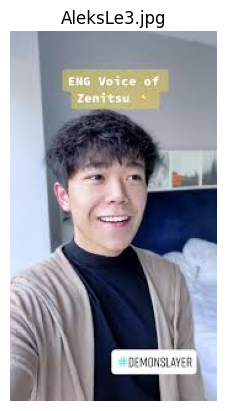

Action: emotion: 100%|██████████| 4/4 [00:04<00:00,  1.01s/it]


Face 1 in AleksLe3.jpg:
Age: 25 years old
Gender: {'Woman': 0.417829817160964, 'Man': 99.58217144012451}
Dominant Race: asian
Dominant Emotion: happy

--------------------------------------------------

{'age': 25, 'region': {'x': 48, 'y': 88, 'w': 63, 'h': 89, 'left_eye': (100, 119), 'right_eye': (69, 120)}, 'face_confidence': 0.84, 'gender': {'Woman': 0.417829817160964, 'Man': 99.58217144012451}, 'dominant_gender': 'Man', 'race': {'asian': 100.0, 'indian': 5.0212026377061125e-11, 'black': 3.997568091308155e-18, 'white': 3.8810007985112804e-08, 'middle eastern': 1.654217631721595e-17, 'latino hispanic': 1.4824617922126748e-08}, 'dominant_race': 'asian', 'emotion': {'angry': 6.702873467110738e-15, 'disgust': 9.443097828065202e-28, 'fear': 2.0800732816481656e-18, 'happy': 99.99990463256836, 'sad': 2.8654620621009364e-13, 'surprise': 4.576219264640358e-09, 'neutral': 9.728158829602762e-05}, 'dominant_emotion': 'happy'}


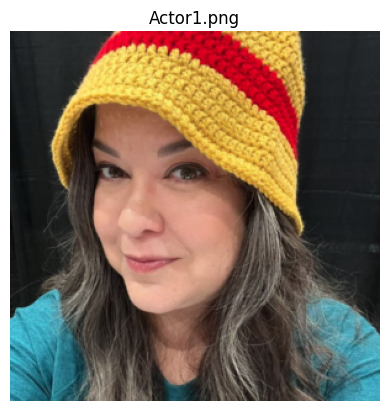

Action: emotion: 100%|██████████| 4/4 [00:04<00:00,  1.13s/it]


Face 1 in Actor1.png:
Age: 34 years old
Gender: {'Woman': 99.8902678489685, 'Man': 0.1097332569770515}
Dominant Race: white
Dominant Emotion: neutral

--------------------------------------------------

{'age': 34, 'region': {'x': 65, 'y': 49, 'w': 127, 'h': 179, 'left_eye': (139, 115), 'right_eye': (83, 116)}, 'face_confidence': 0.84, 'gender': {'Woman': 99.8902678489685, 'Man': 0.1097332569770515}, 'dominant_gender': 'Woman', 'race': {'asian': 34.05218232300071, 'indian': 2.6227274310859956, 'black': 1.3679058059043654, 'white': 39.623837426166226, 'middle eastern': 8.303579932878009, 'latino hispanic': 14.02977574226567}, 'dominant_race': 'white', 'emotion': {'angry': 0.21189346443861723, 'disgust': 3.0021598718121822e-05, 'fear': 0.45467671006917953, 'happy': 1.9697705283761024, 'sad': 21.572260558605194, 'surprise': 0.0006351242973323679, 'neutral': 75.79073309898376}, 'dominant_emotion': 'neutral'}


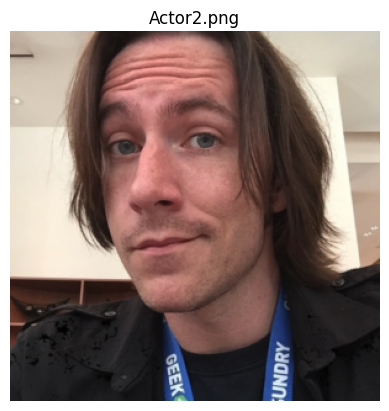

Action: emotion: 100%|██████████| 4/4 [00:06<00:00,  1.57s/it]


Face 1 in Actor2.png:
Age: 39 years old
Gender: {'Woman': 0.30536260455846786, 'Man': 99.6946394443512}
Dominant Race: white
Dominant Emotion: neutral

--------------------------------------------------

{'age': 39, 'region': {'x': 72, 'y': 4, 'w': 136, 'h': 222, 'left_eye': (153, 90), 'right_eye': (89, 94)}, 'face_confidence': 0.86, 'gender': {'Woman': 0.30536260455846786, 'Man': 99.6946394443512}, 'dominant_gender': 'Man', 'race': {'asian': 0.0008334368018223488, 'indian': 0.006028035927605163, 'black': 0.00019489140210899035, 'white': 95.39472433297183, 'middle eastern': 2.3085964357016344, 'latino hispanic': 2.289625952519533}, 'dominant_race': 'white', 'emotion': {'angry': 5.017875507473946, 'disgust': 8.498823262925725e-05, 'fear': 0.21321717649698257, 'happy': 35.25232672691345, 'sad': 2.5558333843946457, 'surprise': 0.0022886559236212634, 'neutral': 56.95837736129761}, 'dominant_emotion': 'neutral'}


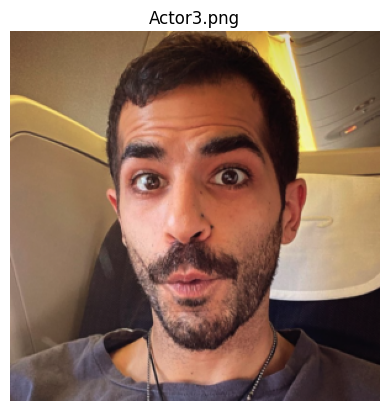

Action: emotion: 100%|██████████| 4/4 [00:05<00:00,  1.33s/it]


Face 1 in Actor3.png:
Age: 33 years old
Gender: {'Woman': 0.005179861182114109, 'Man': 99.99481439590454}
Dominant Race: white
Dominant Emotion: happy

--------------------------------------------------

{'age': 33, 'region': {'x': 87, 'y': 42, 'w': 133, 'h': 215, 'left_eye': (174, 120), 'right_eye': (112, 123)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.005179861182114109, 'Man': 99.99481439590454}, 'dominant_gender': 'Man', 'race': {'asian': 2.668104825091937, 'indian': 9.806220657374936, 'black': 4.132216171290418, 'white': 29.41618316366472, 'middle eastern': 28.926885596142483, 'latino hispanic': 25.05039573316523}, 'dominant_race': 'white', 'emotion': {'angry': 1.9839195534586906, 'disgust': 1.0934636662796038e-05, 'fear': 2.6574023067951202, 'happy': 82.94873237609863, 'sad': 0.0414111273130402, 'surprise': 3.2691214233636856, 'neutral': 9.099401533603668}, 'dominant_emotion': 'happy'}


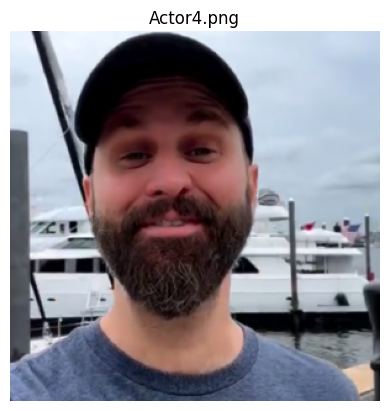

Action: emotion: 100%|██████████| 4/4 [00:06<00:00,  1.58s/it]


Face 1 in Actor4.png:
Age: 37 years old
Gender: {'Woman': 0.0063804131059441715, 'Man': 99.99362230300903}
Dominant Race: white
Dominant Emotion: angry

--------------------------------------------------

{'age': 37, 'region': {'x': 67, 'y': 38, 'w': 126, 'h': 181, 'left_eye': (157, 99), 'right_eye': (99, 101)}, 'face_confidence': 0.86, 'gender': {'Woman': 0.0063804131059441715, 'Man': 99.99362230300903}, 'dominant_gender': 'Man', 'race': {'asian': 1.4009263270155385, 'indian': 6.924338306447167, 'black': 0.6309952031669142, 'white': 41.62091264849381, 'middle eastern': 30.915685350637755, 'latino hispanic': 18.507143468090504}, 'dominant_race': 'white', 'emotion': {'angry': 58.86334531684788, 'disgust': 0.31411074577186976, 'fear': 2.971582850610188, 'happy': 1.196062729273005, 'sad': 30.92420285488384, 'surprise': 0.0023325715600252895, 'neutral': 5.7283620970465}, 'dominant_emotion': 'angry'}


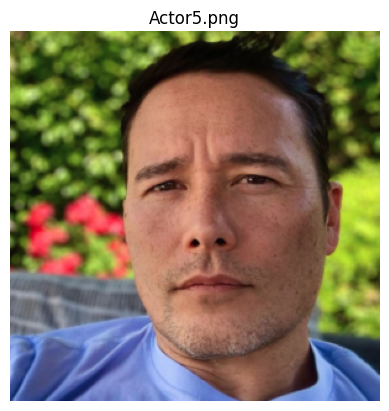

Action: emotion: 100%|██████████| 4/4 [00:04<00:00,  1.15s/it]


Face 1 in Actor5.png:
Age: 32 years old
Gender: {'Woman': 0.2869002288207412, 'Man': 99.71309900283813}
Dominant Race: asian
Dominant Emotion: neutral

--------------------------------------------------

{'age': 32, 'region': {'x': 94, 'y': 35, 'w': 160, 'h': 228, 'left_eye': (197, 121), 'right_eye': (125, 124)}, 'face_confidence': 0.87, 'gender': {'Woman': 0.2869002288207412, 'Man': 99.71309900283813}, 'dominant_gender': 'Man', 'race': {'asian': 49.95764493942261, 'indian': 1.5175473876297474, 'black': 0.31764351297169924, 'white': 36.248981952667236, 'middle eastern': 3.287777677178383, 'latino hispanic': 8.670400083065033}, 'dominant_race': 'asian', 'emotion': {'angry': 0.20485399290919304, 'disgust': 1.9884771607081575e-07, 'fear': 0.0006581134584848769, 'happy': 0.42185266502201557, 'sad': 1.5554853715002537, 'surprise': 1.160248004339337e-05, 'neutral': 97.81714081764221}, 'dominant_emotion': 'neutral'}


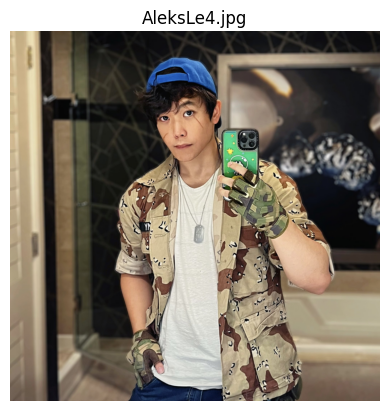

Action: emotion: 100%|██████████| 4/4 [00:05<00:00,  1.39s/it]


Face 1 in AleksLe4.jpg:
Age: 29 years old
Gender: {'Woman': 4.633859917521477, 'Man': 95.36614418029785}
Dominant Race: asian
Dominant Emotion: neutral

--------------------------------------------------

{'age': 29, 'region': {'x': 802, 'y': 319, 'w': 310, 'h': 394, 'left_eye': (986, 453), 'right_eye': (853, 488)}, 'face_confidence': 0.78, 'gender': {'Woman': 4.633859917521477, 'Man': 95.36614418029785}, 'dominant_gender': 'Man', 'race': {'asian': 99.18226599693298, 'indian': 0.03909323422703892, 'black': 0.0010939100320683792, 'white': 0.36632593255490065, 'middle eastern': 0.003699386797961779, 'latino hispanic': 0.40751821361482143}, 'dominant_race': 'asian', 'emotion': {'angry': 4.9629556997388136e-05, 'disgust': 2.1478823817144804e-17, 'fear': 1.7835358079310026e-06, 'happy': 7.809396720404038e-05, 'sad': 0.00024963508167274995, 'surprise': 2.0771576732941943e-10, 'neutral': 99.99961853027344}, 'dominant_emotion': 'neutral'}


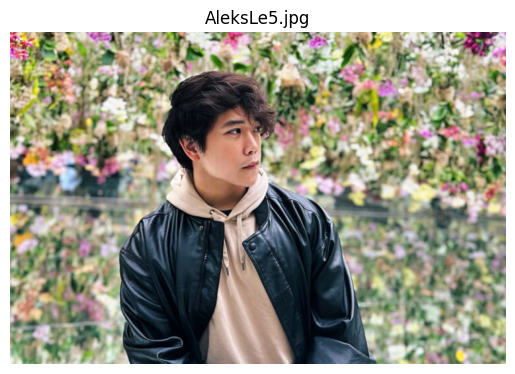

Action: emotion: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]


Face 1 in AleksLe5.jpg:
Age: 30 years old
Gender: {'Woman': 4.701957479119301, 'Man': 95.29803991317749}
Dominant Race: asian
Dominant Emotion: neutral

--------------------------------------------------

{'age': 30, 'region': {'x': 290, 'y': 106, 'w': 92, 'h': 125, 'left_eye': (368, 148), 'right_eye': (337, 152)}, 'face_confidence': 0.77, 'gender': {'Woman': 4.701957479119301, 'Man': 95.29803991317749}, 'dominant_gender': 'Man', 'race': {'asian': 99.99963045115834, 'indian': 6.296682682040039e-06, 'black': 2.117416390674369e-09, 'white': 4.8510969562293944e-05, 'middle eastern': 6.664113389513701e-08, 'latino hispanic': 0.00031823121090492464}, 'dominant_race': 'asian', 'emotion': {'angry': 0.06056762067601085, 'disgust': 1.2863772902920812e-13, 'fear': 6.456057910497748e-07, 'happy': 0.005709782999474555, 'sad': 0.002849373959179502, 'surprise': 5.091017829528255e-07, 'neutral': 99.9308705329895}, 'dominant_emotion': 'neutral'}
Failed to load image: ds_model_vggface_detector_opencv_a

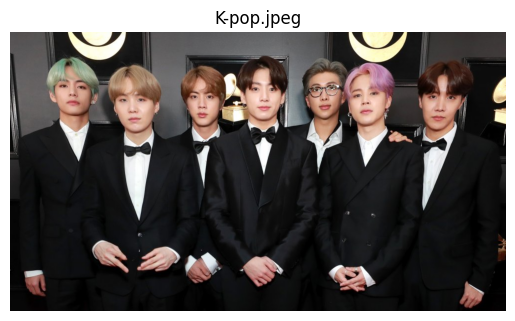

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]


Face 1 in K-pop.jpeg:
Age: 30 years old
Gender: {'Woman': 2.3018255829811096, 'Man': 97.69818186759949}
Dominant Race: asian
Dominant Emotion: neutral

--------------------------------------------------

{'age': 30, 'region': {'x': 683, 'y': 83, 'w': 75, 'h': 101, 'left_eye': (734, 122), 'right_eye': (699, 123)}, 'face_confidence': 0.8, 'gender': {'Woman': 2.3018255829811096, 'Man': 97.69818186759949}, 'dominant_gender': 'Man', 'race': {'asian': 64.07144665718079, 'indian': 2.63318307697773, 'black': 0.9272858500480652, 'white': 18.984127044677734, 'middle eastern': 5.579978972673416, 'latino hispanic': 7.8039757907390594}, 'dominant_race': 'asian', 'emotion': {'angry': 8.098049461841583, 'disgust': 0.07235689554363489, 'fear': 6.38420432806015, 'happy': 0.6057403516024351, 'sad': 25.119328498840332, 'surprise': 0.1320709940046072, 'neutral': 59.58825349807739}, 'dominant_emotion': 'neutral'}
Face 2 in K-pop.jpeg:
Age: 30 years old
Gender: {'Woman': 39.12041187286377, 'Man': 60.8795881

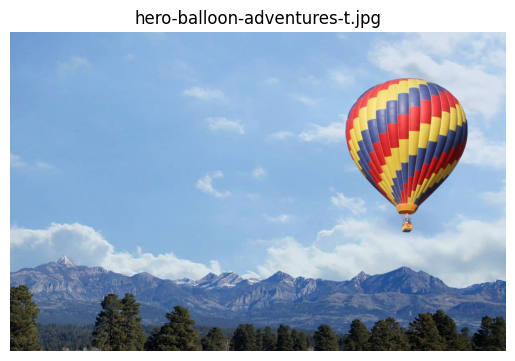

Error processing image hero-balloon-adventures-t.jpg: Face could not be detected in /content/drive/MyDrive/sra_images/hero-balloon-adventures-t.jpg.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


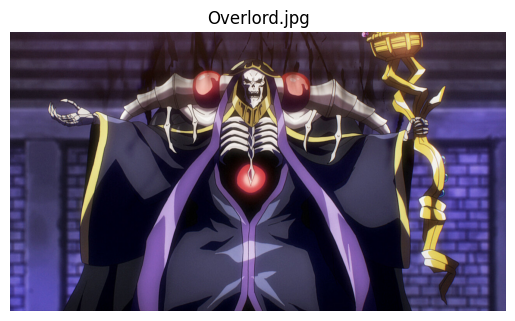

Error processing image Overlord.jpg: Face could not be detected in /content/drive/MyDrive/sra_images/Overlord.jpg.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


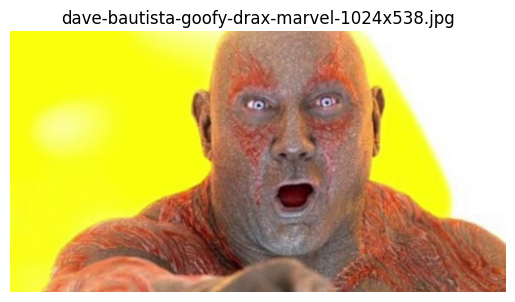

Action: emotion: 100%|██████████| 4/4 [00:03<00:00,  1.17it/s]


Face 1 in dave-bautista-goofy-drax-marvel-1024x538.jpg:
Age: 35 years old
Gender: {'Woman': 1.5789391472935677, 'Man': 98.42106103897095}
Dominant Race: white
Dominant Emotion: fear

--------------------------------------------------

{'age': 35, 'region': {'x': 415, 'y': 12, 'w': 330, 'h': 442, 'left_eye': (653, 148), 'right_eye': (515, 152)}, 'face_confidence': 0.86, 'gender': {'Woman': 1.5789391472935677, 'Man': 98.42106103897095}, 'dominant_gender': 'Man', 'race': {'asian': 0.7266329601407051, 'indian': 0.9455205872654915, 'black': 0.1444251975044608, 'white': 78.78779172897339, 'middle eastern': 12.720160186290741, 'latino hispanic': 6.675469875335693}, 'dominant_race': 'white', 'emotion': {'angry': 1.206929566792198, 'disgust': 0.025524091457094725, 'fear': 97.72462221677569, 'happy': 0.341599428769878, 'sad': 0.0174613311980389, 'surprise': 0.6804882894293415, 'neutral': 0.0033749573434419373}, 'dominant_emotion': 'fear'}


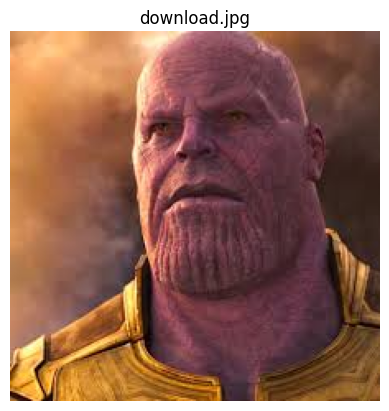

Action: emotion: 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]


Face 1 in download.jpg:
Age: 47 years old
Gender: {'Woman': 0.8199444971978664, 'Man': 99.18004870414734}
Dominant Race: white
Dominant Emotion: angry

--------------------------------------------------

{'age': 47, 'region': {'x': 78, 'y': 7, 'w': 101, 'h': 144, 'left_eye': (136, 54), 'right_eye': (90, 57)}, 'face_confidence': 0.79, 'gender': {'Woman': 0.8199444971978664, 'Man': 99.18004870414734}, 'dominant_gender': 'Man', 'race': {'asian': 1.9000093942622698e-06, 'indian': 7.830524282326223e-05, 'black': 7.971658888550337e-07, 'white': 99.66373443603516, 'middle eastern': 0.29314581770449877, 'latino hispanic': 0.04303631721995771}, 'dominant_race': 'white', 'emotion': {'angry': 60.0266909535668, 'disgust': 0.0012692370248961464, 'fear': 0.6710915623237939, 'happy': 22.928715246030034, 'sad': 10.874207705448221, 'surprise': 1.7472119561524495, 'neutral': 3.7508057800994443}, 'dominant_emotion': 'angry'}


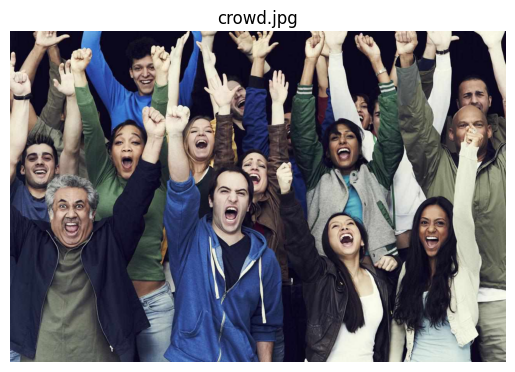

Action: emotion: 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]


Face 1 in crowd.jpg:
Age: 31 years old
Gender: {'Woman': 63.840293884277344, 'Man': 36.159706115722656}
Dominant Race: asian
Dominant Emotion: angry

--------------------------------------------------

{'age': 31, 'region': {'x': 822, 'y': 469, 'w': 84, 'h': 105, 'left_eye': (880, 498), 'right_eye': (839, 504)}, 'face_confidence': 0.82, 'gender': {'Woman': 63.840293884277344, 'Man': 36.159706115722656}, 'dominant_gender': 'Woman', 'race': {'asian': 71.19014859199524, 'indian': 0.27104378677904606, 'black': 0.07836104487068951, 'white': 23.42677116394043, 'middle eastern': 1.1023369617760181, 'latino hispanic': 3.9313357323408127}, 'dominant_race': 'asian', 'emotion': {'angry': 96.87664490202933, 'disgust': 1.2923678633162785e-21, 'fear': 1.1033707955998657, 'happy': 1.9681570361946246, 'sad': 0.05182607291906017, 'surprise': 3.119270558443715e-20, 'neutral': 2.493004724310259e-14}, 'dominant_emotion': 'angry'}
Face 2 in crowd.jpg:
Age: 51 years old
Gender: {'Woman': 0.11270322138443589

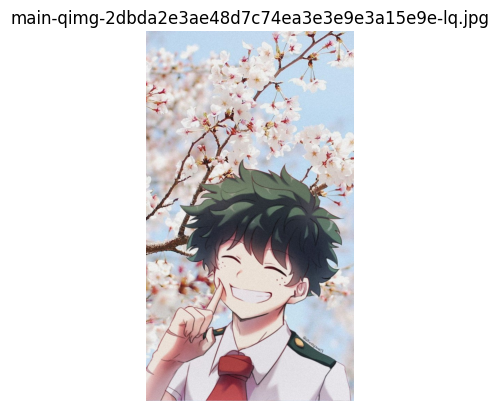

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.61it/s]


Face 1 in main-qimg-2dbda2e3ae48d7c74ea3e3e9e3a15e9e-lq.jpg:
Age: 31 years old
Gender: {'Woman': 5.875430256128311, 'Man': 94.12456154823303}
Dominant Race: white
Dominant Emotion: happy

--------------------------------------------------

{'age': 31, 'region': {'x': 207, 'y': 556, 'w': 236, 'h': 266, 'left_eye': (358, 645), 'right_eye': (277, 633)}, 'face_confidence': 0.41, 'gender': {'Woman': 5.875430256128311, 'Man': 94.12456154823303}, 'dominant_gender': 'Man', 'race': {'asian': 36.36963286218839, 'indian': 0.01544254574768518, 'black': 0.015097167660685936, 'white': 61.57201299500543, 'middle eastern': 0.6597590560322437, 'latino hispanic': 1.3680562261078493}, 'dominant_race': 'white', 'emotion': {'angry': 0.003790810158929648, 'disgust': 8.067355598121279e-09, 'fear': 1.1030701315924172e-08, 'happy': 99.99216198874485, 'sad': 0.004025886540912779, 'surprise': 2.492010990822137e-16, 'neutral': 2.37620639561743e-05}, 'dominant_emotion': 'happy'}


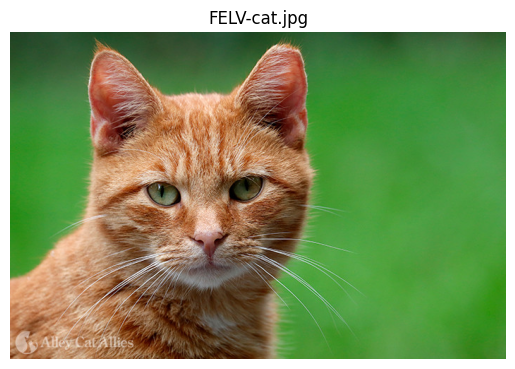

Error processing image FELV-cat.jpg: Face could not be detected in /content/drive/MyDrive/sra_images/FELV-cat.jpg.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


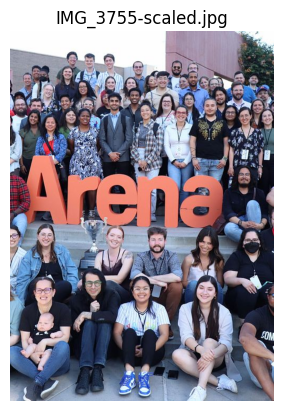

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]


Face 1 in IMG_3755-scaled.jpg:
Age: 26 years old
Gender: {'Woman': 0.8606221526861191, 'Man': 99.13937449455261}
Dominant Race: asian
Dominant Emotion: happy

--------------------------------------------------

{'age': 26, 'region': {'x': 368, 'y': 130, 'w': 22, 'h': 27, 'left_eye': (383, 140), 'right_eye': (373, 141)}, 'face_confidence': 0.76, 'gender': {'Woman': 0.8606221526861191, 'Man': 99.13937449455261}, 'dominant_gender': 'Man', 'race': {'asian': 68.06091070175171, 'indian': 2.346774749457836, 'black': 0.6293533835560083, 'white': 18.636447191238403, 'middle eastern': 2.6847761124372482, 'latino hispanic': 7.641737163066864}, 'dominant_race': 'asian', 'emotion': {'angry': 0.23480583442827052, 'disgust': 3.780165631747996e-05, 'fear': 2.9340012226699326, 'happy': 85.40789062882773, 'sad': 9.175553569131663, 'surprise': 1.3892741149039132, 'neutral': 0.8584280406322431}, 'dominant_emotion': 'happy'}
Face 2 in IMG_3755-scaled.jpg:
Age: 30 years old
Gender: {'Woman': 0.0359143974492

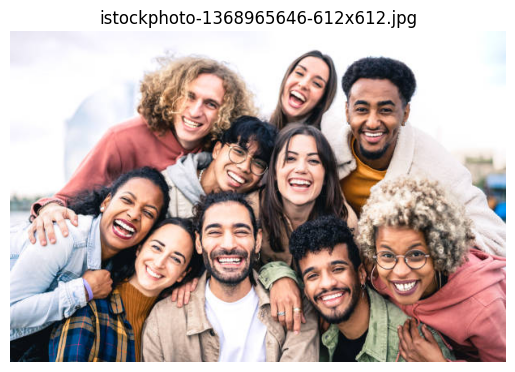

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]


Face 1 in istockphoto-1368965646-612x612.jpg:
Age: 29 years old
Gender: {'Woman': 99.99833106994629, 'Man': 0.0016690961274434812}
Dominant Race: white
Dominant Emotion: happy

--------------------------------------------------

{'age': 29, 'region': {'x': 329, 'y': 124, 'w': 59, 'h': 86, 'left_eye': (376, 157), 'right_eye': (343, 155)}, 'face_confidence': 0.82, 'gender': {'Woman': 99.99833106994629, 'Man': 0.0016690961274434812}, 'dominant_gender': 'Woman', 'race': {'asian': 2.9975812882184982, 'indian': 0.8306044153869152, 'black': 0.06358499522320926, 'white': 60.34189462661743, 'middle eastern': 21.89333587884903, 'latino hispanic': 13.872995972633362}, 'dominant_race': 'white', 'emotion': {'angry': 0.011189605114264922, 'disgust': 0.00015899358155401684, 'fear': 0.050199171364778715, 'happy': 97.07449709481035, 'sad': 2.7913194547510796, 'surprise': 3.1170131201832705e-06, 'neutral': 0.07262507868370965}, 'dominant_emotion': 'happy'}
Face 2 in istockphoto-1368965646-612x612.jpg:
A

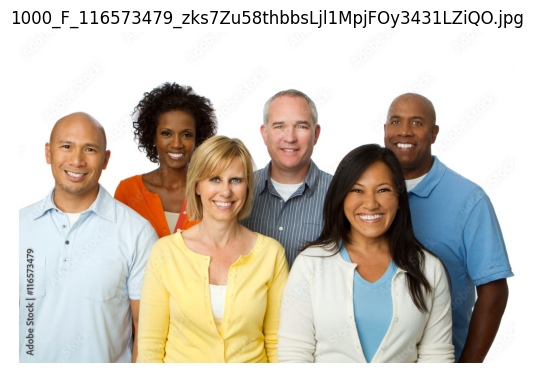

Action: gender:  25%|██▌       | 1/4 [00:01<00:04,  1.46s/it]


KeyboardInterrupt: 

In [ ]:
import pandas as pd
import cv2
import os

# Directory containing images
image_directory = '/content/drive/MyDrive/sra_images/'

# List all files in the directory
image_files = [f for f in os.listdir(image_directory) if os.path.isfile(os.path.join(image_directory, f))]

# Data storage
data = []

# Loop through all image files and analyze each one
for image_file in image_files:
    image_path = os.path.join(image_directory, image_file)

    try:
        # Read the image
        img = cv2.imread(image_path)

        if img is None:
            print(f"Failed to load image: {image_file}")
            continue

        # Display the image (optional)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(image_file)
        plt.axis('off')
        plt.show()

        # Analyze the image
        obj = DeepFace.analyze(img_path=image_path, actions=['age', 'gender', 'race', 'emotion'], detector_backend='yolov8')

        # Check if multiple faces are detected
        if isinstance(obj, list):
          # Looping through each of the detected faces in the image (if there are multiple)
            for i, face in enumerate(obj):
              # Create a dictionary so that we can store all the face data
                face_data = {
                    'Image': image_file,
                    'Face': i+1,
                    'Age': face['age'],
                    'Gender': face['gender'],
                    'Dominant Race': face['dominant_race'],
                    'Dominant Emotion': face['dominant_emotion']
                }
                # Append face data to the main data list
                data.append(face_data)
                # Print the analyzed data for each face. This step is not necessary but I included it for visualization purposes.
                print(f"Face {i+1} in {image_file}:")
                print(f"Age: {face['age']} years old")
                print(f"Gender: {face['gender']}")
                print(f"Dominant Race: {face['dominant_race']}")
                print(f"Dominant Emotion: {face['dominant_emotion']}")
                print("\n" + "-"*50 + "\n")
                print(face)
        else:
            # If only one face is detected, we will create a dictionary for the single face
            face_data = {
                'Image': image_file,
                'Face': 1,
                'Age': obj['age'],
                'Gender': obj['gender'],
                'Dominant Race': obj['dominant_race'],
                'Dominant Emotion': obj['dominant_emotion']
            }
             # Append face data to the main data list
            data.append(face_data)
             # Print the analyzed data for each face. This step is not necessary but I included it for visualization purposes.
            print(f"Image: {image_file}")
            print(f"Age: {obj['age']} years old")
            print(f"Gender: {obj['gender']}")
            print(f"Dominant Race: {obj['dominant_race']}")
            print(f"Dominant Emotion: {obj['dominant_emotion']}")
            print("\n" + "-"*50 + "\n")
            print(obj)

# Sometimes when dealing with lots of images in a file, it can be beneficial to build in checks to find any errors.
    except Exception as e:
        print(f"Error processing image {image_file}: {e}")

# Convert to DataFrame
df = pd.DataFrame(data)

# Save to CSV
output_csv = '/content/drive/MyDrive/sra_images/face_analysis_results.csv'
df.to_csv(output_csv, index=False)



### Calculating the Ratio of Gender

In [ ]:
from deepface import DeepFace
import cv2

def calculate_male_female_ratio(image_path):
    # Load the image
    img = cv2.imread(image_path)

    results = DeepFace.analyze(img_path=image_path, actions=['gender'], detector_backend='yolov8')

    # Initialize counters
    male_count = 0
    female_count = 0

    # Count male and female faces
    for result in results:
        gender = result.get('dominant_gender')
        if gender:
            print(f"Detected gender: {gender}")
            if gender == 'Man':
                male_count += 1
            elif gender == 'Woman':
                female_count += 1

    # Calculate the ratio
    if female_count > 0:
        ratio = male_count / female_count
    else:
        ratio = 'Undefined (no female faces detected)'

    return male_count, female_count, ratio

image_path = '/content/drive/MyDrive/sra_images/istockphoto-1368965646-612x612.jpg'
male_count, female_count, ratio = calculate_male_female_ratio(image_path)
print(f"Male Count: {male_count}, Female Count: {female_count}, Male to Female Ratio: {ratio}")



Detected gender: Woman
Detected gender: Man
Detected gender: Man
Detected gender: Woman
Detected gender: Man
Detected gender: Man
Detected gender: Man
Detected gender: Woman
Detected gender: Woman
Detected gender: Man
Male Count: 6, Female Count: 4, Male to Female Ratio: 1.5


### Calculating the Ratio of Racial Groups

In [ ]:
def calculate_white_minority_ratio(image_path):
    # Load the image
    img = cv2.imread(image_path)

    results = DeepFace.analyze(img_path=image_path, actions=['race'], detector_backend='yolov8')

    # Initialize counters
    white_count = 0
    minority_count = 0

    # Count white and minority faces
    for result in results:
        dominant_race = result.get('dominant_race')
        if dominant_race:
            print(f"Detected race: {dominant_race}")
            if dominant_race == 'white':
                white_count += 1
            else:
                minority_count += 1

    # Calculate the ratio
    if minority_count > 0:
        ratio = white_count / minority_count
    else:
        ratio = 'Undefined (no minority faces detected)'

    return white_count, minority_count, ratio

image_path = '/content/drive/MyDrive/sra_images/istockphoto-1368965646-612x612.jpg'
white_count, minority_count, ratio = calculate_white_minority_ratio(image_path)
print(f"White Count: {white_count}, Minority Count: {minority_count}, White to Minority Ratio: {ratio}")


Detected race: white
Detected race: middle eastern
Detected race: black
Detected race: black
Detected race: latino hispanic
Detected race: middle eastern
Detected race: white
Detected race: white
Detected race: white
Detected race: asian
White Count: 4, Minority Count: 6, White to Minority Ratio: 0.6666666666666666


# Color Analysis


Extracting color of an image can be useful in many differnt contexts such as in object identification, classification of images, image segmentation, and pattern recognition.  
- Pixel intensity refers to the brightness level of a pixel in a digital image. It is a measure of how much light is captured by the pixel. In the context of color images, pixel intensity is usually measured for each color channel (red, green, and blue), and each channel's intensity can range from 0 to 255 in an 8-bit image.


### Color Moments
Color moments are statistical measures used to describe the color distribution in an image.
- **Mean** The average color value in the image.
- **Skewness** Distribution of color values are not symetical around the mean are biased toward one end of the spectrum. This can result with more darker or more lighter images depending on the type of skewness.

#### Average Color
This can be beneficial for understanding the overall color composition of the image and can be useful for classification. Warmer toned images will have higher average values in the red and yellow channels.

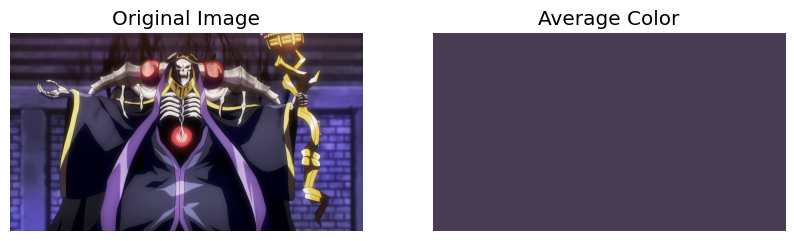

Average Color (RGB): (72.44744032118055, 60.357387152777775, 85.04517361111111)


In [ ]:

def calculate_average_color(image):
    # Split the image into its respective channels
    channels = cv2.split(image)

    # Calculate the mean for each channel
    mean_r = np.mean(channels[0])
    mean_g = np.mean(channels[1])
    mean_b = np.mean(channels[2])

    # Return the mean color as an RGB tuple
    return (mean_r, mean_g, mean_b)

# Load the image
image = cv2.imread('/content/drive/MyDrive/sra_images/Overlord.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Calculate the average color
average_color = calculate_average_color(image)

# Create an image filled with the average color
average_color_image = np.zeros_like(image)
average_color_image[:] = average_color

# Display the original image and the average color image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(average_color_image)
plt.title('Average Color')
plt.axis('off')

plt.show()

# Print the average color
print(f"Average Color (RGB): {average_color}")

#### Skewness of an Image

- Positive values indicate an image is darker.
- Negative values indicate an image is lighter

Skewness - Red channel: 1.3663487384414614
Skewness - Green channel: 1.6732565984991121
Skewness - Blue channel: 0.7398468254345777


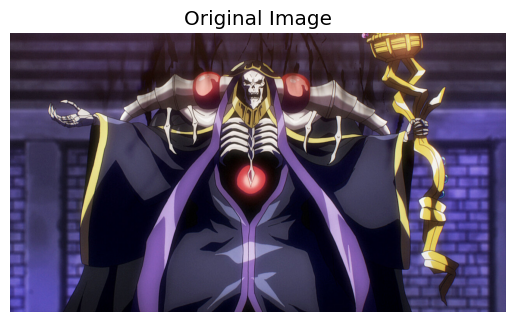

In [ ]:
def calculate_skewness(channel):
    mean = np.mean(channel)
    variance = np.var(channel)
    skewness = np.mean(((channel - mean) / np.sqrt(variance)) ** 3)
    return skewness

# Load an image
image = cv2.imread('/content/drive/MyDrive/sra_images/Overlord.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Split into channels
r, g, b = cv2.split(image)

# Calculate skewness for each channel
skewness_r = calculate_skewness(r)
skewness_g = calculate_skewness(g)
skewness_b = calculate_skewness(b)

print(f"Skewness - Red channel: {skewness_r}")
print(f"Skewness - Green channel: {skewness_g}")
print(f"Skewness - Blue channel: {skewness_b}")

# Display the original image
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')
plt.show()


### Color Histogram

- By comparing the peaks and distribution of each color channel, you can determine if an image has a color cast or if it is well-balanced in terms of color.
- The spread of the histogram indicates the contrast of the image. A wide spread across the intensity range indicates high contrast, while a narrow spread indicates low contrast.
- The spread of the histogram indicates the contrast of the image. A wide spread across the intensity range indicates high contrast, while a narrow spread indicates low contrast.

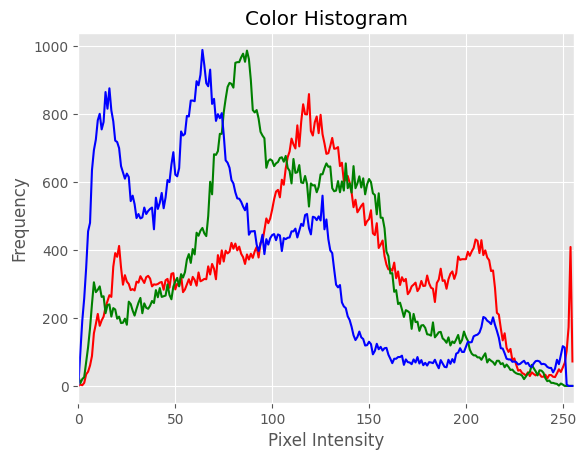

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/drive/MyDrive/sra_images/Actor5.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Calculate color histogram
colors = ('r', 'g', 'b')
for i, color in enumerate(colors):
    hist = cv2.calcHist([image], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
    plt.xlim([0, 256])

plt.title('Color Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

### Hue, Saturation, and Brightness
 - **Hue** refers to the type of color or the shade of the color. 0 is red, 120 is green, 240 is blue.
 - **Saturation** refers to the intensity or purity of the color.
 - **Brightness** refers to the lightness or darkness of the color.


 *Note:* 256 is the maximum possible pixel value for an image.

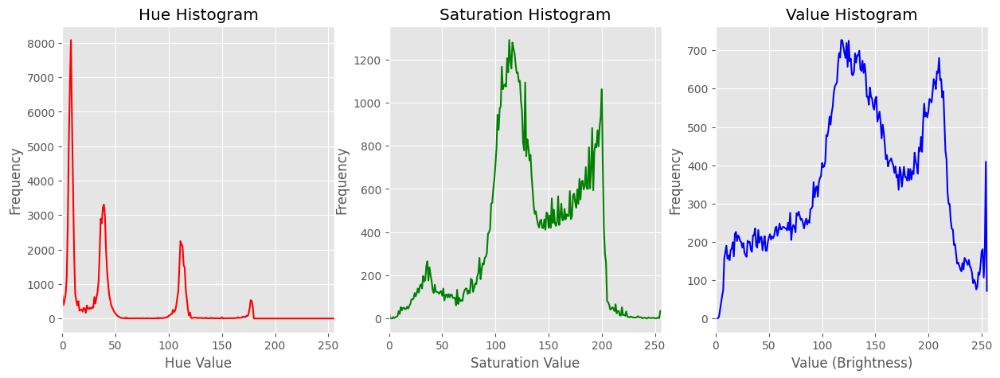

In [ ]:
# Convert image to HSV color space
# ACTOR 5 is the image we are analyzing.
hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# Split channels
h, s, v = cv2.split(hsv_image)

# Calculate histograms for each channel
hist_h = cv2.calcHist([h], [0], None, [256], [0, 256])
hist_s = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_v = cv2.calcHist([v], [0], None, [256], [0, 256])

plt.figure(figsize=(15, 5))

# Plot Hue Histogram
plt.subplot(1, 3, 1)
plt.plot(hist_h, color='r')
plt.title('Hue Histogram')
plt.xlabel('Hue Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Plot Saturation Histogram
plt.subplot(1, 3, 2)
plt.plot(hist_s, color='g')
plt.title('Saturation Histogram')
plt.xlabel('Saturation Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Plot Value Histogram
plt.subplot(1, 3, 3)
plt.plot(hist_v, color='b')
plt.title('Value Histogram')
plt.xlabel('Value (Brightness)')
plt.ylabel('Frequency')
plt.xlim([0, 256])

plt.show()


### Color Coherence Vector

A Color Coherence Vector (CCV) analysis provides information about how color is distributed across an image.

**Coherent Regions**  Pixels that belong to large regions of the same color.
**Incoherent Regions** Pixels that belong to small scattered regions of the same color. This may indicate finer details or smaller objects in an image.

Images with lots of texture (e.g., crowds or nature scenes) are more liklely to have more incoherent pixels.

**Tau** A parameter within this analysis that refers to the cutoff for determining coherent and incoherent. Regions smaller than the specified tau value will be classified as incoherent. Too small values may lead to noise preventing you to distinguish between significant regions of color and overfitting for an individual image. Too large and you may miss important regions of color and can lead to underfitting.

Calculating CCV with tau = 5


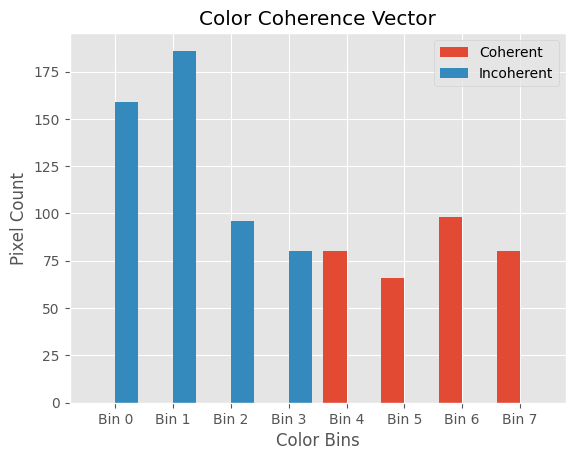

Calculating CCV with tau = 6


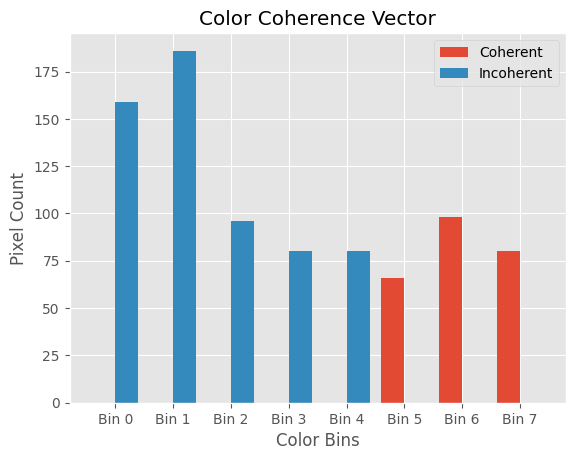

Calculating CCV with tau = 7


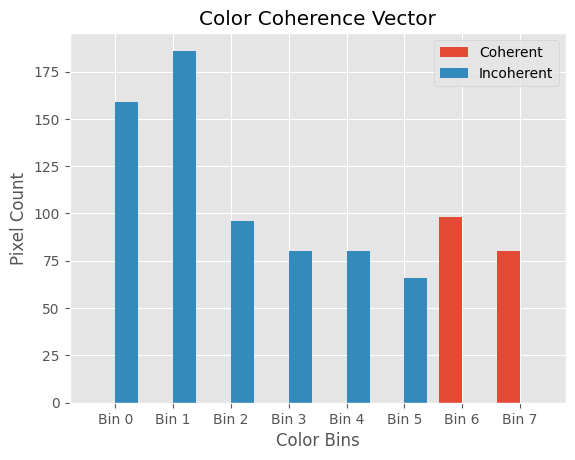

Calculating CCV with tau = 8


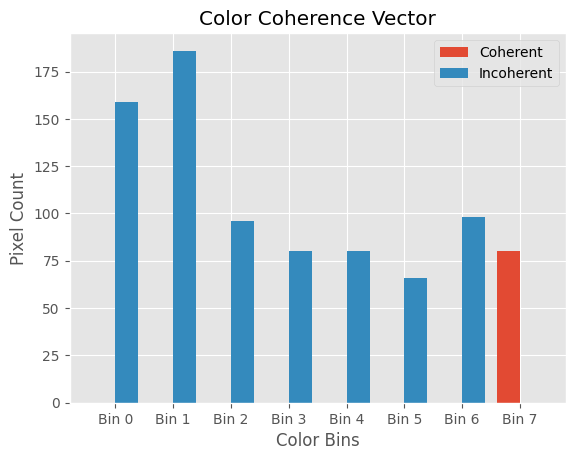

Calculating CCV with tau = 9


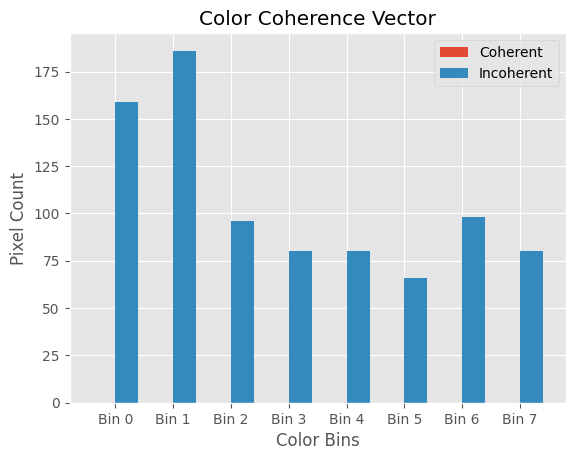

Calculating CCV with tau = 10


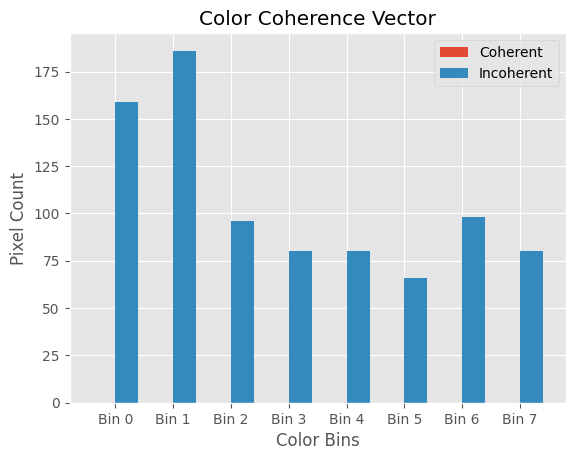

In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def quantize_colors(image, k):
    # Reshape the image to be a list of pixels
    pixels = image.reshape((-1, 3))

    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(pixels)

    # Replace each pixel with its corresponding cluster center
    quantized = kmeans.cluster_centers_.astype('uint8')[kmeans.labels_]

    # Reshape back to the original image shape
    quantized_image = quantized.reshape(image.shape)

    return quantized_image, kmeans.cluster_centers_


def calculate_ccv(image, quantized_image, color_bins, tau):
    h, w, _ = image.shape
    ccv = np.zeros((len(color_bins), 2))  # Coherent and Incoherent counts for each bin

    # Create a label image
    labels = np.zeros((h, w), dtype=np.uint8)

    for i, color in enumerate(color_bins):
        mask = cv2.inRange(quantized_image, color, color)
        labels[mask > 0] = i + 1  # Label connected components starting from 1

    # Find connected components
    num_labels, label_image, stats, centroids = cv2.connectedComponentsWithStats(labels, connectivity=8)

    # Classify each component as coherent or incoherent
    for i in range(1, num_labels):
        size = stats[i, cv2.CC_STAT_AREA]
        # Use 4 instead of cv2.CC_STAT_LABEL for older OpenCV versions
        label = stats[i, 4]
        color_bin = label - 1

        # Ensure color_bin is within valid range
        if 0 <= color_bin < len(color_bins):
            if size >= tau:
                ccv[color_bin, 0] += size  # Coherent
            else:
                ccv[color_bin, 1] += size  # Incoherent

    return ccv

def plot_ccv(ccv, color_bins):
    labels = [f'Bin {i}' for i in range(len(color_bins))]
    coherent = ccv[:, 0]
    incoherent = ccv[:, 1]

    x = np.arange(len(color_bins))

    fig, ax = plt.subplots()
    ax.bar(x - 0.2, coherent, 0.4, label='Coherent')
    ax.bar(x + 0.2, incoherent, 0.4, label='Incoherent')

    ax.set_xlabel('Color Bins')
    ax.set_ylabel('Pixel Count')
    ax.set_title('Color Coherence Vector')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.show()

# Load the image
image = cv2.imread('/content/drive/MyDrive/sra_images/AleksLe2.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Parameters
k = 8  # Number of color bins
taus = [5, 6, 7, 8, 9, 10]  # Different tau values to experiment with

# Quantize the image
quantized_image, color_bins = quantize_colors(image, k)

# Experiment with different tau values
for tau in taus:
    print(f"Calculating CCV with tau = {tau}")
    ccv = calculate_ccv(image, quantized_image, color_bins, tau)
    plot_ccv(ccv, color_bins)

#### Identifying the colors assoociated with the bins

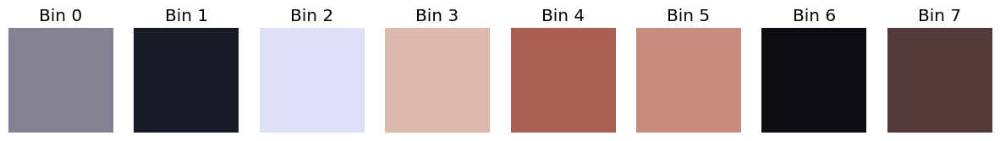

In [ ]:
def quantize_colors(image, k):
    pixels = image.reshape((-1, 3))
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(pixels)
    quantized = kmeans.cluster_centers_.astype('uint8')[kmeans.labels_]
    quantized_image = quantized.reshape(image.shape)
    return quantized_image, kmeans.cluster_centers_

def plot_color_bins(color_bins):
    fig, ax = plt.subplots(1, len(color_bins), figsize=(15, 3))
    for i, color in enumerate(color_bins):
        ax[i].imshow([[color / 255.0]])
        ax[i].set_title(f'Bin {i}')
        ax[i].axis('off')
    plt.show()

# Load the image
image = cv2.imread('/content/drive/MyDrive/sra_images/AleksLe2.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Parameters
k = 8  # Number of color bins

# Quantize the image
quantized_image, color_bins = quantize_colors(image, k)

# Plot the color bins
plot_color_bins(color_bins)